In [0]:
!mkdir test_videos

In [0]:
!mkdir camera_cal
!mkdir test_images
!mkdir test_videos_output

### Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [0]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt

In [0]:
objpoints = [] #3D points in real world space
imgpoints = [] #2D points in image plane

nx = 9
ny = 6

objp = np.zeros((9*6,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

In [0]:
def printImages(img, resultant_image, imgTitle="Original Image", resultTitle = "Resultant Image"):
  f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,10))
  f.subplots_adjust(hspace = .2, wspace=.05)
  ax1.grid(False)
  ax1.imshow(img, cmap="gray")
  ax1.set_title(imgTitle, fontsize=24)
  ax2.grid(False)
  ax2.imshow(resultant_image, cmap="gray")
  ax2.set_title(resultTitle, fontsize=24)

In [4]:
# read the images
images = glob.glob('camera_cal/calibration*.jpg')
print(images)

['camera_cal/calibration3.jpg', 'camera_cal/calibration16.jpg', 'camera_cal/calibration4.jpg', 'camera_cal/calibration8.jpg', 'camera_cal/calibration5.jpg', 'camera_cal/calibration13.jpg', 'camera_cal/calibration11.jpg', 'camera_cal/calibration10.jpg', 'camera_cal/calibration19.jpg', 'camera_cal/calibration1.jpg', 'camera_cal/calibration15.jpg', 'camera_cal/calibration14.jpg', 'camera_cal/calibration17.jpg', 'camera_cal/calibration6.jpg', 'camera_cal/calibration18.jpg', 'camera_cal/calibration2.jpg', 'camera_cal/calibration20.jpg', 'camera_cal/calibration12.jpg', 'camera_cal/calibration7.jpg', 'camera_cal/calibration9.jpg']


In [0]:
# return the undistorted image
#   for index in range(1, cols*rows+1):
# img = plt.imread("test_images/"+images[index-1])
def undistort(img):
  ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
  undist_image = cv2.undistort(img, mtx, dist, None, mtx)
  
  return undist_image

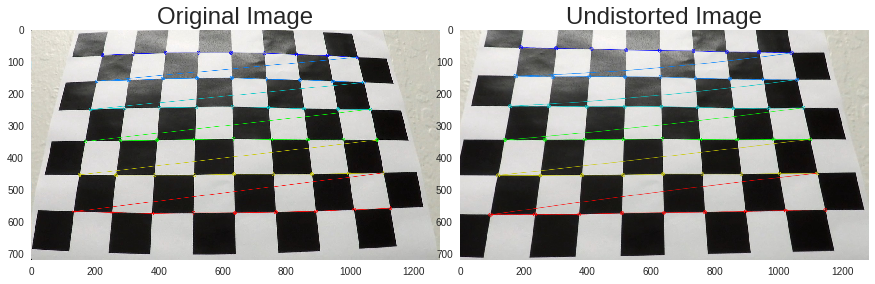

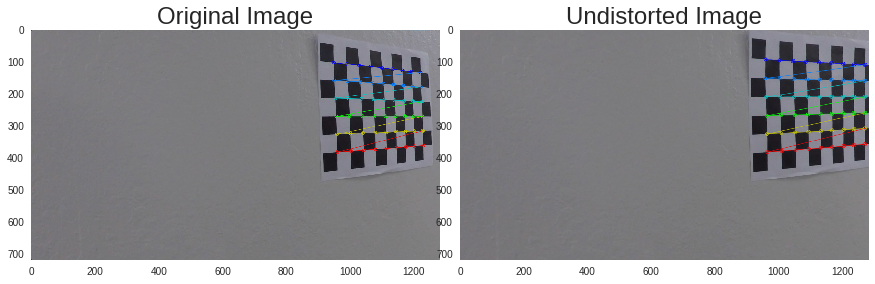

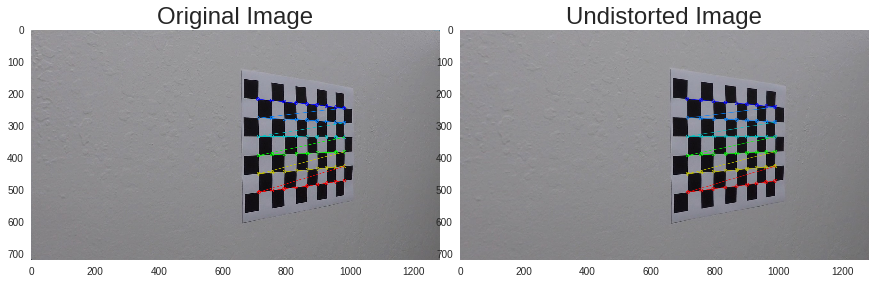

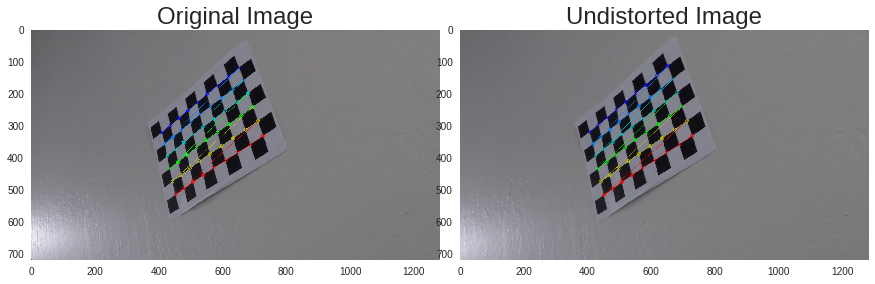

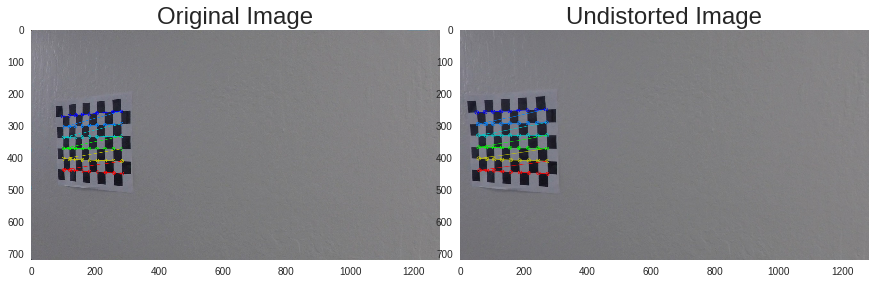

...

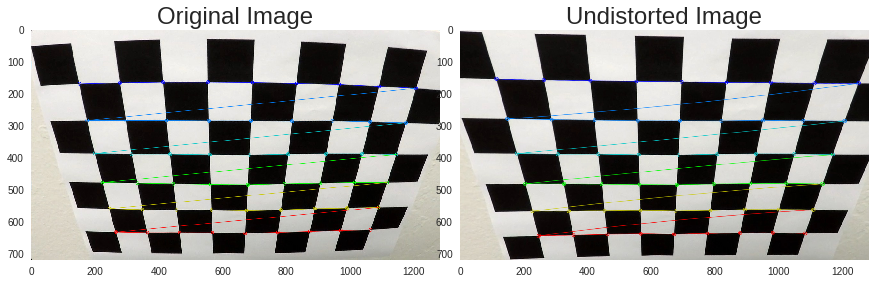

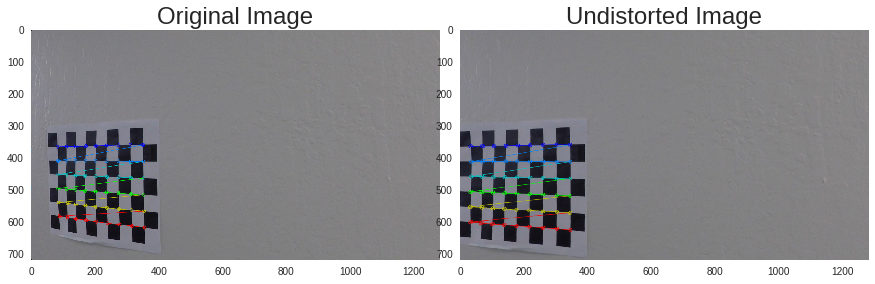

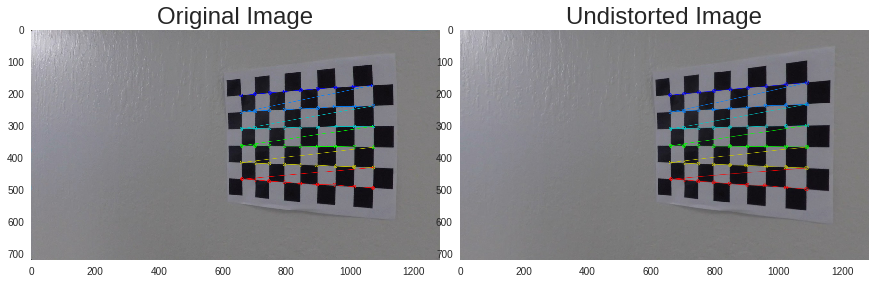

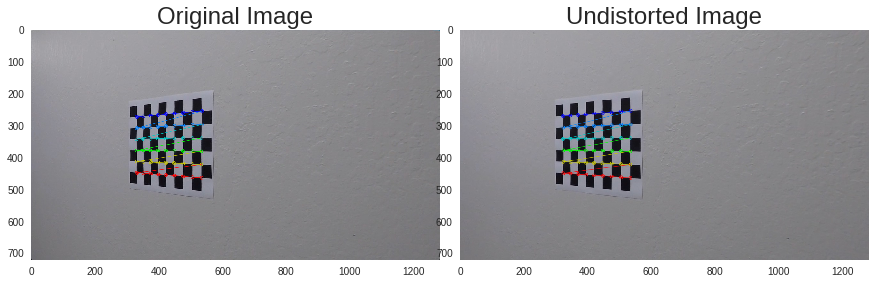

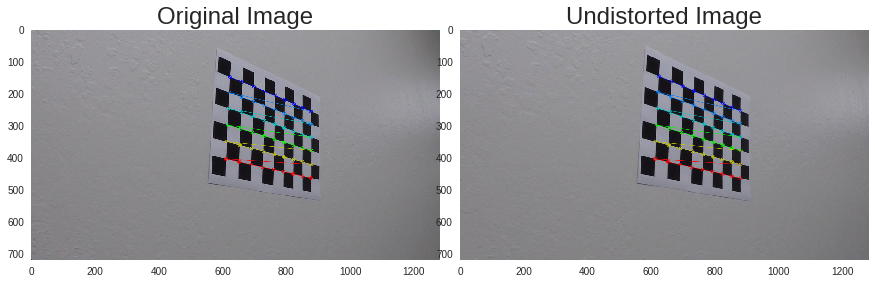

In [6]:
# Step through the list and search for chessboard corners
for index in enumerate(images):
  
  img = plt.imread(images[index[0]])
  gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

  # Find the chessboard corners
  ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

  # If found, add object points, image points
  if ret == True:
      objpoints.append(objp)
      imgpoints.append(corners)

      # Draw and display the corners
      corner_image = cv2.drawChessboardCorners(img, (9,6), corners, ret)
      #undistort the image
      undist_image = undistort(img)
        
      printImages(img, undist_image, resultTitle="Undistorted Image")


In [7]:
test_images = glob.glob('test_images/test*.jpg')
print(test_images)

['test_images/test5.jpg', 'test_images/test1.jpg', 'test_images/test6.jpg', 'test_images/test3.jpg', 'test_images/test4.jpg', 'test_images/test2.jpg']


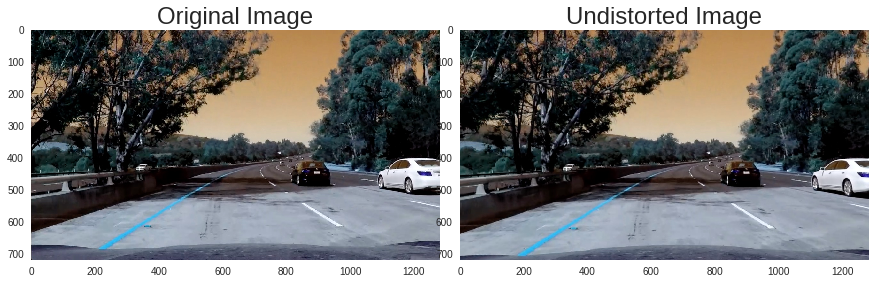

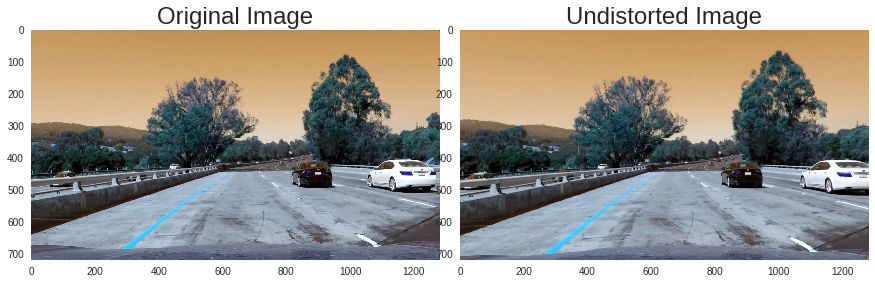

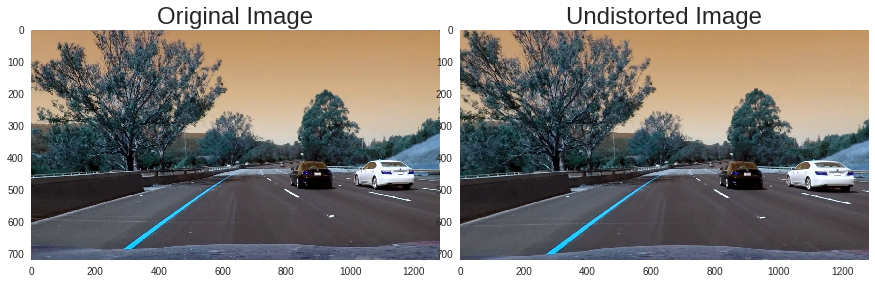

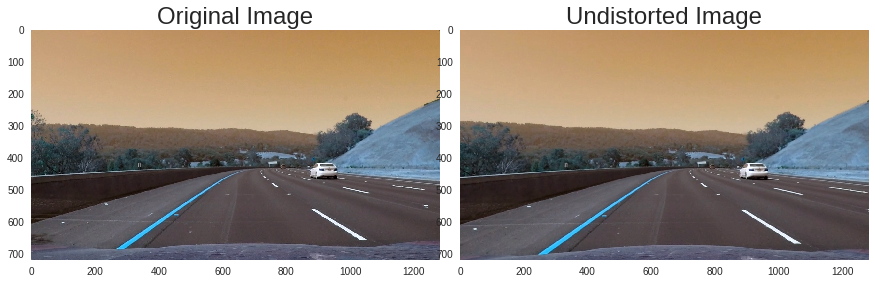

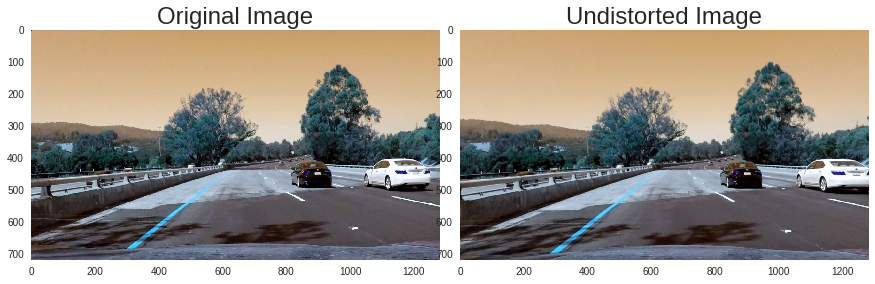

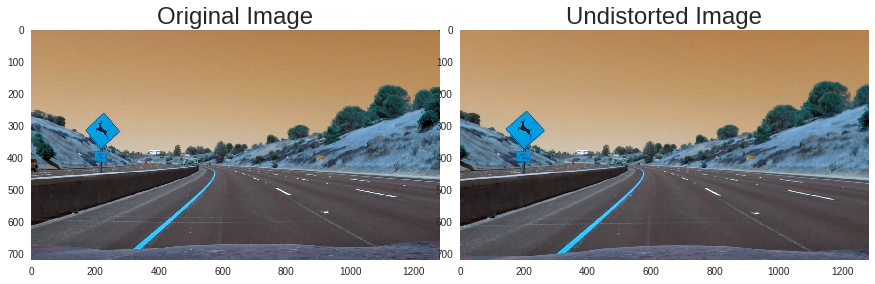

In [52]:
for index in enumerate(test_images):
    img = cv2.imread(test_images[index[0]])
    undist_image = undistort(img)
    
    printImages(img, undist_image, resultTitle="Undistorted Image")

In [0]:
def sobel_thresholding(img, thresh=(50,100), sobel_kernel=7):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  
  # Sobel x
  sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel)
  abs_sobel = np.abs(sobelx)
  scaled_sobel = np.uint8( 255 * abs_sobel / np.max(abs_sobel) )


  # Threshold gradient
  sxbinary = np.zeros_like(scaled_sobel)
  sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
  
  return sxbinary

In [0]:
def binary_thresholding(img, l_thresh=(225,255),s_thresh=(150,255), r_thresh=(220, 255)):
    
    # separating out the three channels in HLS space
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    #R channel
    r_channel = img[:,:,0]
    
    sxbinary = sobel_thresholding(img)

    # Threshold channels
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    r_binary = np.zeros_like(r_channel)
    r_binary[(r_channel >= r_thresh[0]) & (r_channel <= r_thresh[1])] = 1
            
    color_binary = np.zeros_like(s_binary)
    color_binary[(l_binary == 1) | (s_binary == 1) | (r_binary == 1)] = 1
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(color_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

In [11]:
test_images = glob.glob('test_images/test*.jpg')
print(test_images)

['test_images/test5.jpg', 'test_images/test1.jpg', 'test_images/test6.jpg', 'test_images/test3.jpg', 'test_images/test4.jpg', 'test_images/test2.jpg']


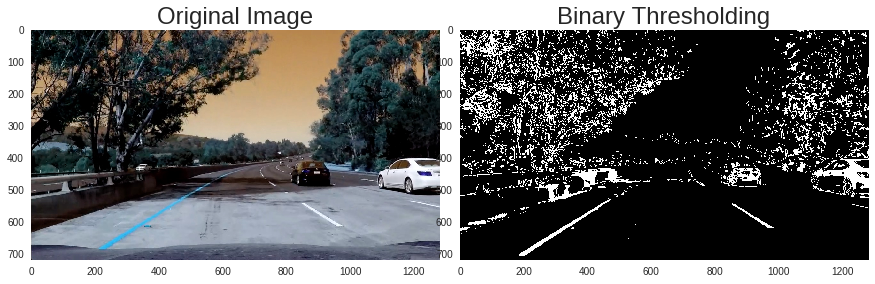

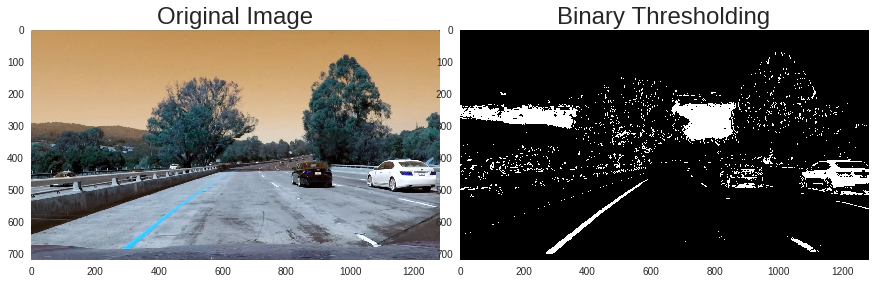

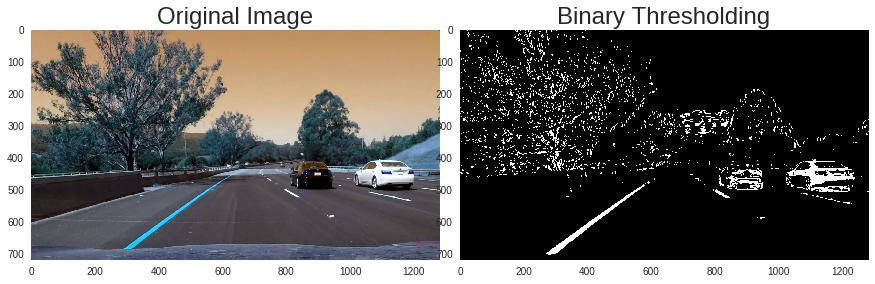

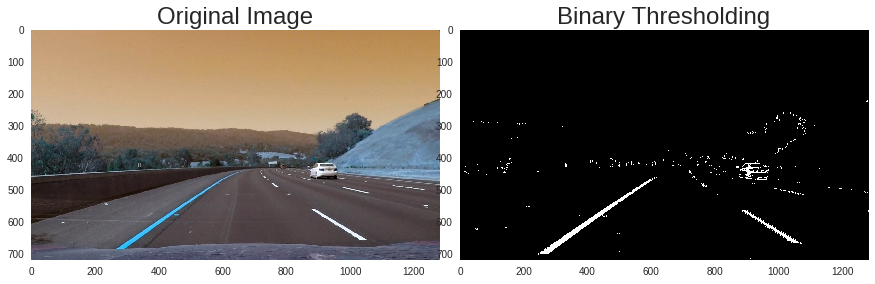

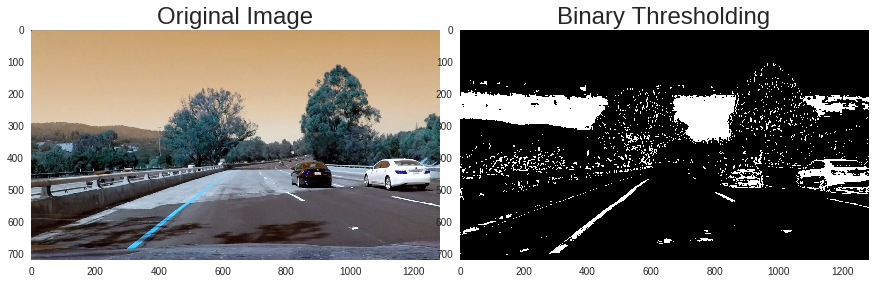

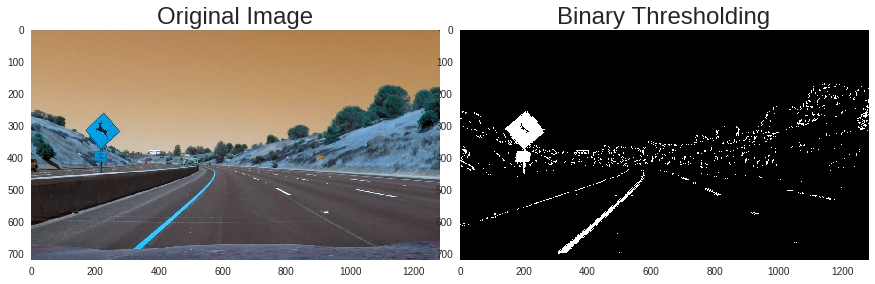

In [12]:
for index in enumerate(test_images):
    img = cv2.imread(test_images[index[0]])
    
    undist_image = undistort(img)

    img_binary = binary_thresholding(undist_image)
    
    printImages(img, img_binary, resultTitle="Binary Thresholding")

In [0]:
def perspectiveTransform(img):
    #set source and destination points
    src = np.float32([(200,720),(1080,720),(700,460),(580,460)])
    dst = np.float32([(200,720),(1080,720),(1080,0),(200,0)])
    
    #apply perspective transform
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]))
    
    return warped

In [0]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [0]:
def masking(combined):
  imshape = combined.shape
  # Masking quadrilateral to get the region of interest
  vertices = np.array(
  [[
      (imshape[1]*0.13, imshape[0]),
      (imshape[1]*0.43, imshape[0]*0.61),
      (imshape[1]*0.573,imshape[0]*0.61),
      (imshape[1]*0.98 ,imshape[0])
  ]], dtype=np.int32)
  
#   vertices = np.array(
#   [[
#       (100, 0),
#       (imshape[1], 0),
#       (150,imshape[0]),
#       (imshape[1], imshape[0])
#   ]], dtype=np.int32)

  ## Masking of Image according to region of interest
  masked_image = region_of_interest(combined, vertices)
  
  return masked_image

In [16]:
test_images = glob.glob('test_images/test*.jpg')
print(test_images)

['test_images/test5.jpg', 'test_images/test1.jpg', 'test_images/test6.jpg', 'test_images/test3.jpg', 'test_images/test4.jpg', 'test_images/test2.jpg']


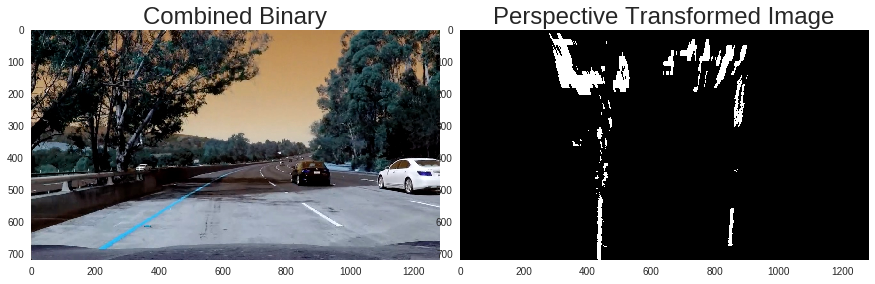

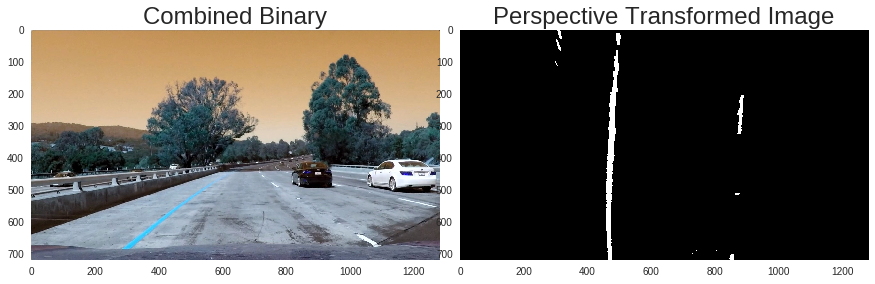

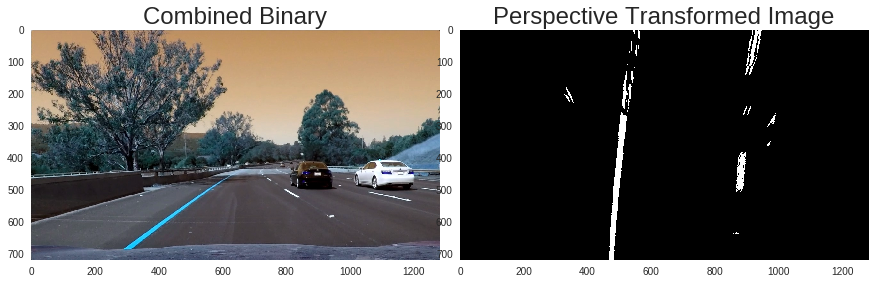

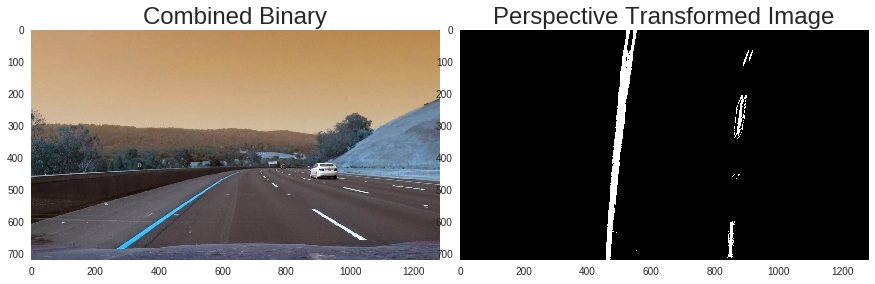

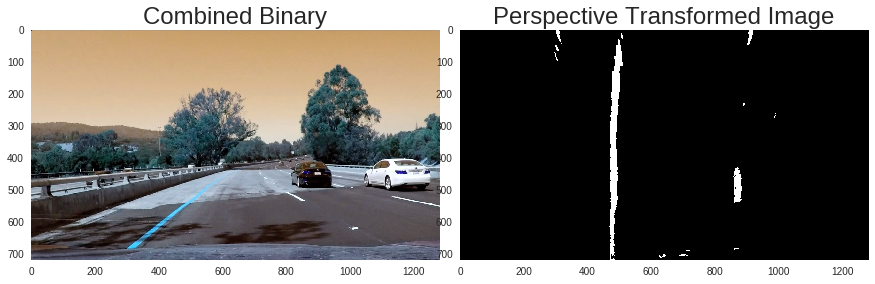

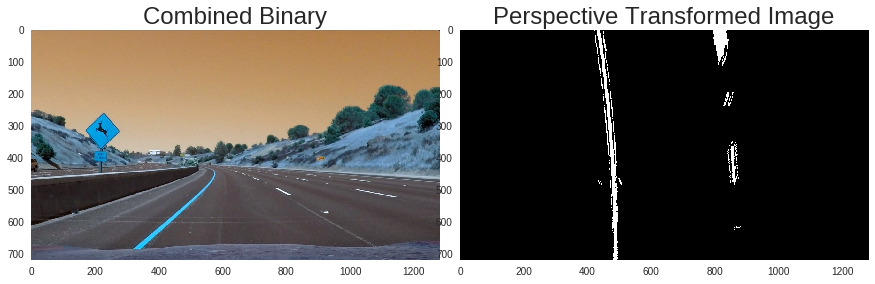

In [44]:
warped_images = []
for index in enumerate(test_images):
    #read a raw image
    img =  cv2.imread(test_images[index[0]])
    
    #Undistort raw image
    undist_image = undistort(img)
    
    #Apply Threshold
    combined_image = binary_thresholding(undist_image)
    
    #Apply Masking
    masked_image = masking(combined_image)
        
    #Perform Perspective transform
    perspective_transformed_image = perspectiveTransform(masked_image)
    
    #Save Warped Images
    warped_images.append(perspective_transformed_image)
    printImages(img,perspective_transformed_image, 'Combined Binary', 'Perspective Transformed Image')


In [0]:
def find_lane_pixels(warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((warped, warped, warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped.shape[0] - (window+1)*window_height
        win_y_high = warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(warped):
    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img,left_fit,right_fit

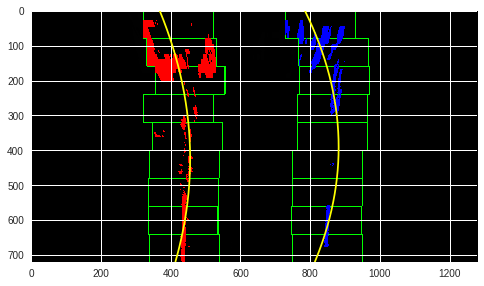

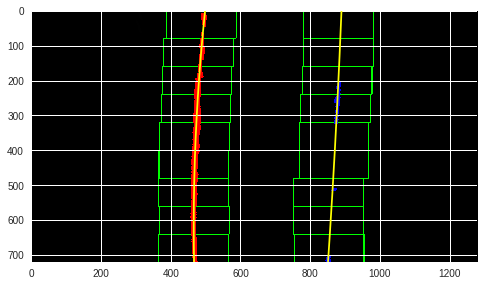

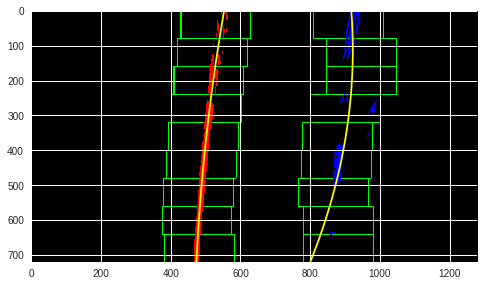

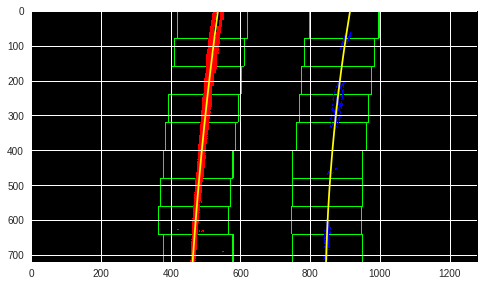

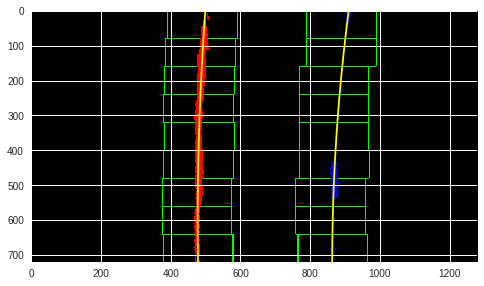

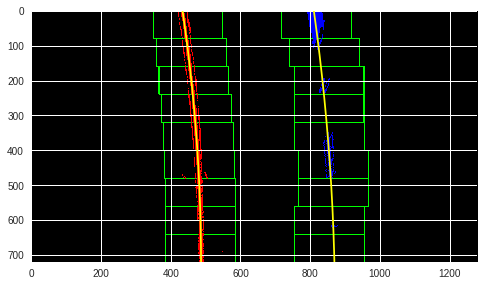

<Figure size 576x396 with 0 Axes>

In [45]:
#Fit polynomial and show lane lines
for img in warped_images:
    lane_lines,left_fit,right_fit = fit_polynomial(img)
    plt.imshow(lane_lines)
    plt.figure()

In [0]:
def estimate_curvature(x_val,warped):
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/900 # meteres per pixel in x dimension
    
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_val = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    y_eval = np.max(y_val)
    
    # Calculation of R_curve (radius of curvature)
    fit_cr = np.polyfit(y_val*ym_per_pix, x_val*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
       
    return curverad

In [0]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(warped):
    
    margin = 100

    # Grab activated pixels
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((warped, warped, warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    
    
    ## End visualization steps ##
    
    return result,left_fitx,right_fitx

In [0]:
def draw_radius_curvature(warped,img,left_fitx,right_fitx):
    #Measuring Radius of Curvature for left and right lanes
    left_curverad = estimate_curvature(left_fitx,warped)
    right_curverad = estimate_curvature(right_fitx,warped)    
    average_curverad = (left_curverad + right_curverad)/2
    
    # meters per pixel in y dimension
    x_m_per_pix = 3.7/896
    
    lane_center = (left_fitx[-1] + right_fitx[-1]) // 2
    # Car center, Assuming the camera is mounted in the middle
    car_center = img.shape[1]/2
    # Calculate center offset
    center_offset = (lane_center - car_center) * x_m_per_pix
    
    #Add Curvature and offset information to image
    cv2.putText(img,"Curvature = %0.2f m" %average_curverad , (120, 100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255), thickness=5)
    cv2.putText(img, "Center Offset = %0.2f m" %center_offset, (120, 150), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255), thickness=5)
    
    return img

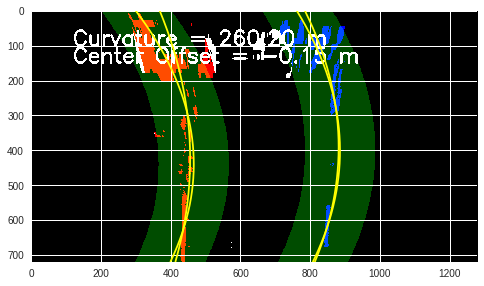

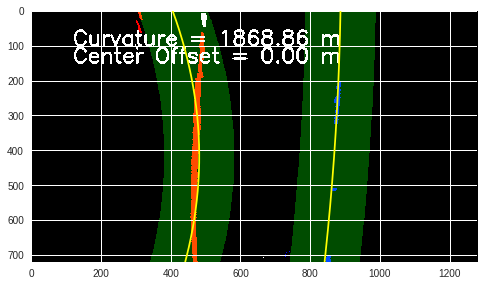

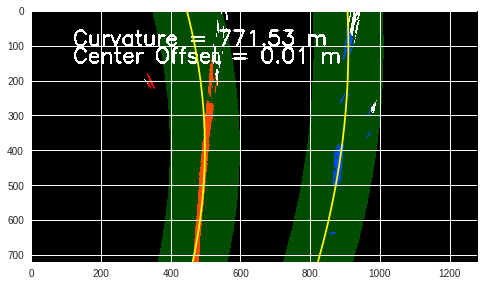

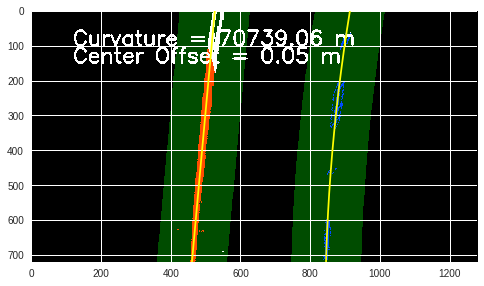

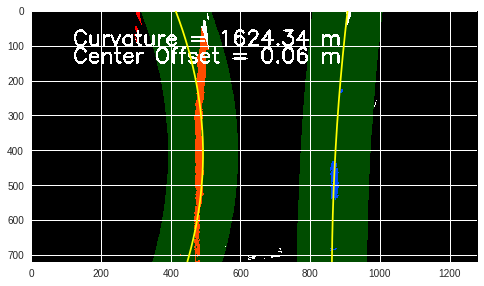

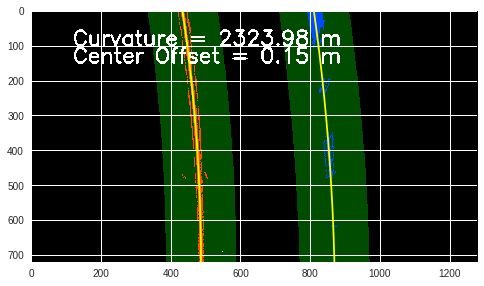

<Figure size 576x396 with 0 Axes>

In [46]:
lane_lines,left_fit,right_fit = fit_polynomial(warped_images[0])
#Fit polynomial and show lane lines
for img in warped_images:
    result,left_fitx,right_fitx = search_around_poly(img)
    result = draw_radius_curvature(result,result,left_fitx,right_fitx)    
    plt.imshow(result)
    plt.figure()

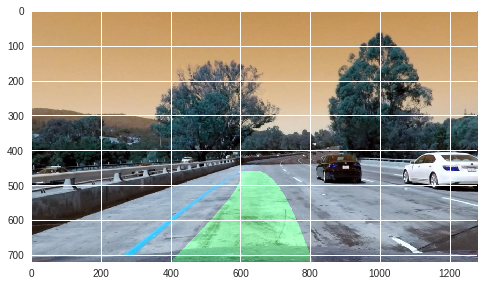

In [47]:
image = cv2.imread('test_images/test1.jpg')
warped = warped_images[0]
undist = undistort(image)

margin = 100

# Grab activated pixels
nonzero = warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
    
### Set the area of search based on activated x-values ###
### within the +/- margin of our polynomial function ###
    
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
        
# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]

# Fit new polynomials
left_fitx, right_fitx, ploty = fit_poly(warped.shape, leftx, lefty, rightx, righty)
        
# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        
#set source and destination points
src = np.float32([(200,720),(1080,720),(700,460),(580,460)])
dst = np.float32([(200,720),(1080,720),(1080,0),(200,0)])

Minv = cv2.getPerspectiveTransform(dst, src)

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
plt.imshow(result)

In [0]:
def sliding_window(warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return out_img,left_fit,right_fit,left_fitx,right_fitx,ploty

def sliding_window_from_prior(warped,left_best_fit, right_best_fit):
    margin = 100

    # Grab activated pixels
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    
    left_lane_inds = ((nonzerox > (left_best_fit[0]*(nonzeroy**2) + left_best_fit[1]*nonzeroy + 
                    left_best_fit[2] - margin)) & (nonzerox < (left_best_fit[0]*(nonzeroy**2) + 
                    left_best_fit[1]*nonzeroy + left_best_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_best_fit[0]*(nonzeroy**2) + right_best_fit[1]*nonzeroy + 
                    right_best_fit[2] - margin)) & (nonzerox < (right_best_fit[0]*(nonzeroy**2) + 
                    right_best_fit[1]*nonzeroy + right_best_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((warped, warped, warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    
    ## End visualization steps ##
    
    return result,left_fit,right_fit,left_fitx,right_fitx,ploty

# Checking the lane values
def lane_accuracy(lane_lines,left_fit,right_fit,left_fitx,right_fitx,ploty):
    
    #Measuring Radius of Curvature for left and right lanes
    left_curverad = estimate_curvature(left_fitx,lane_lines)
    right_curverad = estimate_curvature(right_fitx,lane_lines)    
    average_curverad = (left_curverad + right_curverad)/2
    
    # meters per pixel in y dimension
    x_m_per_pix = 3.7/700
    
    mean_distance = np.mean(right_fitx - left_fitx) * x_m_per_pix
    
    lane_center = (left_fitx[-1] + right_fitx[-1]) // 2
    # Car center, Assuming the camera is mounted in the middle
    car_center = img.shape[1]/2
    # Calculate center offset
    center_offset = abs((lane_center - car_center) * x_m_per_pix)
    
    if mean_distance < 2.5 or mean_distance > 5:
        return False
    if center_offset > 0.5 or center_offset < -0.5 :
        return False
    
    # Checking radius
    
    if average_curverad < 30:
        return False
    if average_curverad > 1000:
        return False
    # Default value
    return True

def get_line_avg(prev_lines, new_line):    
    # Number of frames to average over
    num_frames = 25
    # if there is no new line
    if new_line is None:        
        if len(prev_lines) == 0:
            return previous_lines, None
        else:
            # Return previous line
            return prev_lines, prev_lines[-1]
    else:
        if len(prev_lines) < num_frames:
            # we need at least 10 frames to average over
            prev_lines.append(new_line)
            return prev_lines, new_line
        else:
            # average over the last 10 frames
            prev_lines[0:num_frames-1] = prev_lines[1:]
            prev_lines[num_frames-1] = new_line
            new_line = np.zeros_like(new_line)
            for i in range(num_frames):
                new_line += prev_lines[i]
            new_line /= num_frames
            return prev_lines,new_line

In [0]:
left_best_fit = None
right_best_fit = None
prev_best_left_lines = []
prev_best_right_lines = []

def pipeline(image):
    
    global left_best_fit
    global right_best_fit
    global prev_best_left_lines
    global prev_best_right_lines
    
    original_image = np.copy(image)
    
    #Undistort raw image
    undist_image = undistort(original_image)
    
    #Apply Threshold
    combined_binary = binary_thresholding(undist_image)
    
    #Masking
    masked_image = masking(combined_binary)
    
    #Perform Perspective transform
    perspective_transform_image = perspectiveTransform(masked_image)
    
    left_fit = None
    right_fit = None
    
    left_best_fit = None
    right_best_fit = None
    
    #if not left_line.detected or not right_line.detected:
    lane_lines,left_fit,right_fit,left_fitx,right_fitx,ploty = sliding_window(perspective_transform_image)
    
    if left_best_fit == None or right_best_fit == None:
        lane_lines,left_fit,right_fit,left_fitx,right_fitx,ploty = sliding_window(perspective_transform_image)
    else:
        lane_lines,left_fit,right_fit,left_fitx,right_fitx,ploty = sliding_window_from_prior(perspective_transform_image,left_best_fit,right_best_fit)
        
        if left_fit is not None and right_fit is not None:
            if not lane_accuracy(lane_lines,left_fit,right_fit,left_fitx,right_fitx,ploty):
                lane_lines,left_fit,right_fit,left_fitx,right_fitx,ploty = sliding_window(perspective_transform_image)    
     
    left_best_fit = left_fit
    right_best_fit = right_fit
    
    prev_best_left_lines,left_fitx = get_line_avg(prev_best_left_lines,left_fitx)
    prev_best_right_lines,right_fitx = get_line_avg(prev_best_right_lines,right_fitx)
    
        
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(perspective_transform_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        
    #set source and destination points
    src = np.float32([(200,720),(1080,720),(700,460),(580,460)])
    dst = np.float32([(200,720),(1080,720),(1080,0),(200,0)])
  
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (perspective_transform_image.shape[1], perspective_transform_image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist_image, 1, newwarp, 0.3, 0)
    
    ##Draw Radius and Curvature information
    result = draw_radius_curvature(lane_lines,result,left_fitx,right_fitx)
    
    return result

In [0]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [50]:
white_output = 'test_videos_output/project_video_output.mp4'
clip1 = VideoFileClip("test_videos/project_video.mp4")
white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(white_output, audio=False)

None
[MoviePy] >>>> Building video test_videos_output/project_video_output.mp4
[MoviePy] Writing video test_videos_output/project_video_output.mp4







  0%|          | 0/1261 [00:00<?, ?it/s]




  0%|          | 1/1261 [00:01<22:37,  1.08s/it]

None







  0%|          | 2/1261 [00:02<22:41,  1.08s/it]

None







  0%|          | 3/1261 [00:03<22:38,  1.08s/it]

None







  0%|          | 4/1261 [00:04<22:37,  1.08s/it]

None







  0%|          | 5/1261 [00:05<22:39,  1.08s/it]

None







  0%|          | 6/1261 [00:06<22:38,  1.08s/it]

None







  1%|          | 7/1261 [00:07<22:34,  1.08s/it]

None







  1%|          | 8/1261 [00:08<22:30,  1.08s/it]

None







  1%|          | 9/1261 [00:09<22:31,  1.08s/it]

None







  1%|          | 10/1261 [00:10<22:34,  1.08s/it]

None







  1%|          | 11/1261 [00:11<22:31,  1.08s/it]

None







  1%|          | 12/1261 [00:12<22:31,  1.08s/it]

None







  1%|          | 13/1261 [00:14<22:24,  1.08s/it]

None







  1%|          | 14/1261 [00:15<22:23,  1.08s/it]

None







  1%|          | 15/1261 [00:16<22:23,  1.08s/it]

None







  1%|▏         | 16/1261 [00:17<22:21,  1.08s/it]

None







  1%|▏         | 17/1261 [00:18<22:22,  1.08s/it]

None







  1%|▏         | 18/1261 [00:19<22:15,  1.07s/it]

None







  2%|▏         | 19/1261 [00:20<22:12,  1.07s/it]

None







  2%|▏         | 20/1261 [00:21<22:09,  1.07s/it]

None







  2%|▏         | 21/1261 [00:22<22:05,  1.07s/it]

None







  2%|▏         | 22/1261 [00:23<22:06,  1.07s/it]

None







  2%|▏         | 23/1261 [00:24<22:07,  1.07s/it]

None







  2%|▏         | 24/1261 [00:25<22:10,  1.08s/it]

None







  2%|▏         | 25/1261 [00:26<22:09,  1.08s/it]

None







  2%|▏         | 26/1261 [00:28<22:09,  1.08s/it]

None







  2%|▏         | 27/1261 [00:29<22:06,  1.07s/it]

None







  2%|▏         | 28/1261 [00:30<22:06,  1.08s/it]

None







  2%|▏         | 29/1261 [00:31<22:03,  1.07s/it]

None







  2%|▏         | 30/1261 [00:32<22:04,  1.08s/it]

None







  2%|▏         | 31/1261 [00:33<22:03,  1.08s/it]

None







  3%|▎         | 32/1261 [00:34<22:02,  1.08s/it]

None







  3%|▎         | 33/1261 [00:35<22:06,  1.08s/it]

None







  3%|▎         | 34/1261 [00:36<22:07,  1.08s/it]

None







  3%|▎         | 35/1261 [00:37<22:06,  1.08s/it]

None







  3%|▎         | 36/1261 [00:38<22:06,  1.08s/it]

None







  3%|▎         | 37/1261 [00:39<22:06,  1.08s/it]

None







  3%|▎         | 38/1261 [00:40<22:05,  1.08s/it]

None







  3%|▎         | 39/1261 [00:42<22:02,  1.08s/it]

None







  3%|▎         | 40/1261 [00:43<21:57,  1.08s/it]

None







  3%|▎         | 41/1261 [00:44<21:56,  1.08s/it]

None







  3%|▎         | 42/1261 [00:45<21:56,  1.08s/it]

None







  3%|▎         | 43/1261 [00:46<23:06,  1.14s/it]

None







  3%|▎         | 44/1261 [00:47<22:50,  1.13s/it]

None







  4%|▎         | 45/1261 [00:48<22:35,  1.11s/it]

None







  4%|▎         | 46/1261 [00:49<22:21,  1.10s/it]

None







  4%|▎         | 47/1261 [00:50<22:20,  1.10s/it]

None







  4%|▍         | 48/1261 [00:52<22:31,  1.11s/it]

None







  4%|▍         | 49/1261 [00:53<22:34,  1.12s/it]

None







  4%|▍         | 50/1261 [00:54<22:31,  1.12s/it]

None







  4%|▍         | 51/1261 [00:55<22:34,  1.12s/it]

None







  4%|▍         | 52/1261 [00:56<22:44,  1.13s/it]

None







  4%|▍         | 53/1261 [00:57<22:50,  1.13s/it]

None







  4%|▍         | 54/1261 [00:58<22:43,  1.13s/it]

None







  4%|▍         | 55/1261 [01:00<23:03,  1.15s/it]

None







  4%|▍         | 56/1261 [01:01<23:01,  1.15s/it]

None







  5%|▍         | 57/1261 [01:02<22:52,  1.14s/it]

None







  5%|▍         | 58/1261 [01:03<22:46,  1.14s/it]

None







  5%|▍         | 59/1261 [01:04<22:59,  1.15s/it]

None







  5%|▍         | 60/1261 [01:05<22:55,  1.15s/it]

None







  5%|▍         | 61/1261 [01:06<22:42,  1.14s/it]

None







  5%|▍         | 62/1261 [01:07<22:36,  1.13s/it]

None







  5%|▍         | 63/1261 [01:09<22:41,  1.14s/it]

None







  5%|▌         | 64/1261 [01:10<22:35,  1.13s/it]

None







  5%|▌         | 65/1261 [01:11<22:21,  1.12s/it]

None







  5%|▌         | 66/1261 [01:12<22:16,  1.12s/it]

None







  5%|▌         | 67/1261 [01:13<22:35,  1.14s/it]

None







  5%|▌         | 68/1261 [01:14<22:34,  1.14s/it]

None







  5%|▌         | 69/1261 [01:15<22:23,  1.13s/it]

None







  6%|▌         | 70/1261 [01:17<22:14,  1.12s/it]

None







  6%|▌         | 71/1261 [01:18<22:34,  1.14s/it]

None







  6%|▌         | 72/1261 [01:19<22:34,  1.14s/it]

None







  6%|▌         | 73/1261 [01:20<22:23,  1.13s/it]

None







  6%|▌         | 74/1261 [01:21<22:13,  1.12s/it]

None







  6%|▌         | 75/1261 [01:22<22:32,  1.14s/it]

None







  6%|▌         | 76/1261 [01:23<22:27,  1.14s/it]

None







  6%|▌         | 77/1261 [01:24<22:14,  1.13s/it]

None







  6%|▌         | 78/1261 [01:26<22:10,  1.12s/it]

None







  6%|▋         | 79/1261 [01:27<22:22,  1.14s/it]

None







  6%|▋         | 80/1261 [01:28<22:20,  1.14s/it]

None







  6%|▋         | 81/1261 [01:29<22:11,  1.13s/it]

None







  7%|▋         | 82/1261 [01:30<22:09,  1.13s/it]

None







  7%|▋         | 83/1261 [01:31<22:23,  1.14s/it]

None







  7%|▋         | 84/1261 [01:32<22:24,  1.14s/it]

None







  7%|▋         | 85/1261 [01:34<22:14,  1.13s/it]

None







  7%|▋         | 86/1261 [01:35<22:10,  1.13s/it]

None







  7%|▋         | 87/1261 [01:36<22:26,  1.15s/it]

None







  7%|▋         | 88/1261 [01:37<22:22,  1.14s/it]

None







  7%|▋         | 89/1261 [01:38<22:14,  1.14s/it]

None







  7%|▋         | 90/1261 [01:39<22:06,  1.13s/it]

None







  7%|▋         | 91/1261 [01:40<22:26,  1.15s/it]

None







  7%|▋         | 92/1261 [01:42<22:16,  1.14s/it]

None







  7%|▋         | 93/1261 [01:43<21:58,  1.13s/it]

None







  7%|▋         | 94/1261 [01:44<21:48,  1.12s/it]

None







  8%|▊         | 95/1261 [01:45<22:02,  1.13s/it]

None







  8%|▊         | 96/1261 [01:46<21:49,  1.12s/it]

None







  8%|▊         | 97/1261 [01:47<21:39,  1.12s/it]

None







  8%|▊         | 98/1261 [01:48<21:37,  1.12s/it]

None







  8%|▊         | 99/1261 [01:49<21:57,  1.13s/it]

None







  8%|▊         | 100/1261 [01:51<22:01,  1.14s/it]

None







  8%|▊         | 101/1261 [01:52<21:51,  1.13s/it]

None







  8%|▊         | 102/1261 [01:53<21:42,  1.12s/it]

None







  8%|▊         | 103/1261 [01:54<21:57,  1.14s/it]

None







  8%|▊         | 104/1261 [01:55<21:51,  1.13s/it]

None







  8%|▊         | 105/1261 [01:56<21:45,  1.13s/it]

None







  8%|▊         | 106/1261 [01:57<21:41,  1.13s/it]

None







  8%|▊         | 107/1261 [01:58<21:54,  1.14s/it]

None







  9%|▊         | 108/1261 [02:00<21:52,  1.14s/it]

None







  9%|▊         | 109/1261 [02:01<21:47,  1.14s/it]

None







  9%|▊         | 110/1261 [02:02<21:43,  1.13s/it]

None







  9%|▉         | 111/1261 [02:03<21:57,  1.15s/it]

None







  9%|▉         | 112/1261 [02:04<21:53,  1.14s/it]

None







  9%|▉         | 113/1261 [02:05<21:41,  1.13s/it]

None







  9%|▉         | 114/1261 [02:06<21:33,  1.13s/it]

None







  9%|▉         | 115/1261 [02:08<21:49,  1.14s/it]

None







  9%|▉         | 116/1261 [02:09<21:41,  1.14s/it]

None







  9%|▉         | 117/1261 [02:10<21:34,  1.13s/it]

None







  9%|▉         | 118/1261 [02:11<21:23,  1.12s/it]

None







  9%|▉         | 119/1261 [02:12<21:35,  1.13s/it]

None







 10%|▉         | 120/1261 [02:13<21:28,  1.13s/it]

None







 10%|▉         | 121/1261 [02:14<21:24,  1.13s/it]

None







 10%|▉         | 122/1261 [02:15<21:20,  1.12s/it]

None







 10%|▉         | 123/1261 [02:17<21:33,  1.14s/it]

None







 10%|▉         | 124/1261 [02:18<21:29,  1.13s/it]

None







 10%|▉         | 125/1261 [02:19<21:20,  1.13s/it]

None







 10%|▉         | 126/1261 [02:20<21:10,  1.12s/it]

None







 10%|█         | 127/1261 [02:21<21:17,  1.13s/it]

None







 10%|█         | 128/1261 [02:22<21:15,  1.13s/it]

None







 10%|█         | 129/1261 [02:23<21:10,  1.12s/it]

None







 10%|█         | 130/1261 [02:24<21:08,  1.12s/it]

None







 10%|█         | 131/1261 [02:26<21:21,  1.13s/it]

None







 10%|█         | 132/1261 [02:27<21:15,  1.13s/it]

None







 11%|█         | 133/1261 [02:28<21:06,  1.12s/it]

None







 11%|█         | 134/1261 [02:29<21:01,  1.12s/it]

None







 11%|█         | 135/1261 [02:30<21:10,  1.13s/it]

None







 11%|█         | 136/1261 [02:31<21:10,  1.13s/it]

None







 11%|█         | 137/1261 [02:32<21:06,  1.13s/it]

None







 11%|█         | 138/1261 [02:33<21:02,  1.12s/it]

None







 11%|█         | 139/1261 [02:35<21:23,  1.14s/it]

None







 11%|█         | 140/1261 [02:36<21:20,  1.14s/it]

None







 11%|█         | 141/1261 [02:37<21:14,  1.14s/it]

None







 11%|█▏        | 142/1261 [02:38<21:10,  1.14s/it]

None







 11%|█▏        | 143/1261 [02:39<21:24,  1.15s/it]

None







 11%|█▏        | 144/1261 [02:40<21:16,  1.14s/it]

None







 11%|█▏        | 145/1261 [02:41<21:06,  1.14s/it]

None







 12%|█▏        | 146/1261 [02:43<20:58,  1.13s/it]

None







 12%|█▏        | 147/1261 [02:44<21:08,  1.14s/it]

None







 12%|█▏        | 148/1261 [02:45<21:10,  1.14s/it]

None







 12%|█▏        | 149/1261 [02:46<20:57,  1.13s/it]

None







 12%|█▏        | 150/1261 [02:47<20:48,  1.12s/it]

None







 12%|█▏        | 151/1261 [02:48<21:00,  1.14s/it]

None







 12%|█▏        | 152/1261 [02:49<20:58,  1.13s/it]

None







 12%|█▏        | 153/1261 [02:51<20:50,  1.13s/it]

None







 12%|█▏        | 154/1261 [02:52<20:40,  1.12s/it]

None







 12%|█▏        | 155/1261 [02:53<20:50,  1.13s/it]

None







 12%|█▏        | 156/1261 [02:54<20:47,  1.13s/it]

None







 12%|█▏        | 157/1261 [02:55<20:42,  1.13s/it]

None







 13%|█▎        | 158/1261 [02:56<20:40,  1.12s/it]

None







 13%|█▎        | 159/1261 [02:57<20:51,  1.14s/it]

None







 13%|█▎        | 160/1261 [02:58<20:44,  1.13s/it]

None







 13%|█▎        | 161/1261 [03:00<20:36,  1.12s/it]

None







 13%|█▎        | 162/1261 [03:01<20:33,  1.12s/it]

None







 13%|█▎        | 163/1261 [03:02<20:40,  1.13s/it]

None







 13%|█▎        | 164/1261 [03:03<20:32,  1.12s/it]

None







 13%|█▎        | 165/1261 [03:04<20:28,  1.12s/it]

None







 13%|█▎        | 166/1261 [03:05<20:27,  1.12s/it]

None







 13%|█▎        | 167/1261 [03:06<20:36,  1.13s/it]

None







 13%|█▎        | 168/1261 [03:07<20:38,  1.13s/it]

None







 13%|█▎        | 169/1261 [03:09<20:31,  1.13s/it]

None







 13%|█▎        | 170/1261 [03:10<20:27,  1.13s/it]

None







 14%|█▎        | 171/1261 [03:11<20:42,  1.14s/it]

None







 14%|█▎        | 172/1261 [03:12<20:39,  1.14s/it]

None







 14%|█▎        | 173/1261 [03:13<20:29,  1.13s/it]

None







 14%|█▍        | 174/1261 [03:14<20:20,  1.12s/it]

None







 14%|█▍        | 175/1261 [03:15<20:37,  1.14s/it]

None







 14%|█▍        | 176/1261 [03:17<20:34,  1.14s/it]

None







 14%|█▍        | 177/1261 [03:18<20:25,  1.13s/it]

None







 14%|█▍        | 178/1261 [03:19<20:24,  1.13s/it]

None







 14%|█▍        | 179/1261 [03:20<20:29,  1.14s/it]

None







 14%|█▍        | 180/1261 [03:21<20:21,  1.13s/it]

None







 14%|█▍        | 181/1261 [03:22<20:17,  1.13s/it]

None







 14%|█▍        | 182/1261 [03:23<20:12,  1.12s/it]

None







 15%|█▍        | 183/1261 [03:24<20:24,  1.14s/it]

None







 15%|█▍        | 184/1261 [03:26<20:21,  1.13s/it]

None







 15%|█▍        | 185/1261 [03:27<20:19,  1.13s/it]

None







 15%|█▍        | 186/1261 [03:28<20:13,  1.13s/it]

None







 15%|█▍        | 187/1261 [03:29<20:29,  1.14s/it]

None







 15%|█▍        | 188/1261 [03:30<20:20,  1.14s/it]

None







 15%|█▍        | 189/1261 [03:31<20:13,  1.13s/it]

None







 15%|█▌        | 190/1261 [03:32<20:07,  1.13s/it]

None







 15%|█▌        | 191/1261 [03:34<20:18,  1.14s/it]

None







 15%|█▌        | 192/1261 [03:35<20:17,  1.14s/it]

None







 15%|█▌        | 193/1261 [03:36<20:07,  1.13s/it]

None







 15%|█▌        | 194/1261 [03:37<20:01,  1.13s/it]

None







 15%|█▌        | 195/1261 [03:38<20:17,  1.14s/it]

None







 16%|█▌        | 196/1261 [03:39<20:20,  1.15s/it]

None







 16%|█▌        | 197/1261 [03:40<20:05,  1.13s/it]

None







 16%|█▌        | 198/1261 [03:41<20:02,  1.13s/it]

None







 16%|█▌        | 199/1261 [03:43<20:13,  1.14s/it]

None







 16%|█▌        | 200/1261 [03:44<20:10,  1.14s/it]

None







 16%|█▌        | 201/1261 [03:45<20:05,  1.14s/it]

None







 16%|█▌        | 202/1261 [03:46<19:57,  1.13s/it]

None







 16%|█▌        | 203/1261 [03:47<20:07,  1.14s/it]

None







 16%|█▌        | 204/1261 [03:48<20:02,  1.14s/it]

None







 16%|█▋        | 205/1261 [03:49<19:52,  1.13s/it]

None







 16%|█▋        | 206/1261 [03:51<19:50,  1.13s/it]

None







 16%|█▋        | 207/1261 [03:52<20:03,  1.14s/it]

None







 16%|█▋        | 208/1261 [03:53<20:03,  1.14s/it]

None







 17%|█▋        | 209/1261 [03:54<19:48,  1.13s/it]

None







 17%|█▋        | 210/1261 [03:55<19:43,  1.13s/it]

None







 17%|█▋        | 211/1261 [03:56<19:54,  1.14s/it]

None







 17%|█▋        | 212/1261 [03:57<19:46,  1.13s/it]

None







 17%|█▋        | 213/1261 [03:58<19:41,  1.13s/it]

None







 17%|█▋        | 214/1261 [04:00<19:37,  1.12s/it]

None







 17%|█▋        | 215/1261 [04:01<19:50,  1.14s/it]

None







 17%|█▋        | 216/1261 [04:02<19:45,  1.13s/it]

None







 17%|█▋        | 217/1261 [04:03<19:37,  1.13s/it]

None







 17%|█▋        | 218/1261 [04:04<19:28,  1.12s/it]

None







 17%|█▋        | 219/1261 [04:05<19:43,  1.14s/it]

None







 17%|█▋        | 220/1261 [04:06<19:40,  1.13s/it]

None







 18%|█▊        | 221/1261 [04:07<19:29,  1.12s/it]

None







 18%|█▊        | 222/1261 [04:09<19:19,  1.12s/it]

None







 18%|█▊        | 223/1261 [04:10<19:33,  1.13s/it]

None







 18%|█▊        | 224/1261 [04:11<19:31,  1.13s/it]

None







 18%|█▊        | 225/1261 [04:12<19:23,  1.12s/it]

None







 18%|█▊        | 226/1261 [04:13<19:19,  1.12s/it]

None







 18%|█▊        | 227/1261 [04:14<19:33,  1.13s/it]

None







 18%|█▊        | 228/1261 [04:15<19:25,  1.13s/it]

None







 18%|█▊        | 229/1261 [04:16<19:19,  1.12s/it]

None







 18%|█▊        | 230/1261 [04:18<19:11,  1.12s/it]

None







 18%|█▊        | 231/1261 [04:19<19:27,  1.13s/it]

None







 18%|█▊        | 232/1261 [04:20<19:23,  1.13s/it]

None







 18%|█▊        | 233/1261 [04:21<19:13,  1.12s/it]

None







 19%|█▊        | 234/1261 [04:22<19:07,  1.12s/it]

None







 19%|█▊        | 235/1261 [04:23<19:24,  1.13s/it]

None







 19%|█▊        | 236/1261 [04:24<19:19,  1.13s/it]

None







 19%|█▉        | 237/1261 [04:25<19:09,  1.12s/it]

None







 19%|█▉        | 238/1261 [04:27<19:04,  1.12s/it]

None







 19%|█▉        | 239/1261 [04:28<19:12,  1.13s/it]

None







 19%|█▉        | 240/1261 [04:29<19:09,  1.13s/it]

None







 19%|█▉        | 241/1261 [04:30<19:03,  1.12s/it]

None







 19%|█▉        | 242/1261 [04:31<18:59,  1.12s/it]

None







 19%|█▉        | 243/1261 [04:32<19:13,  1.13s/it]

None







 19%|█▉        | 244/1261 [04:33<19:12,  1.13s/it]

None







 19%|█▉        | 245/1261 [04:35<19:07,  1.13s/it]

None







 20%|█▉        | 246/1261 [04:36<19:04,  1.13s/it]

None







 20%|█▉        | 247/1261 [04:37<19:16,  1.14s/it]

None







 20%|█▉        | 248/1261 [04:38<19:10,  1.14s/it]

None







 20%|█▉        | 249/1261 [04:39<19:02,  1.13s/it]

None







 20%|█▉        | 250/1261 [04:40<18:55,  1.12s/it]

None







 20%|█▉        | 251/1261 [04:41<19:07,  1.14s/it]

None







 20%|█▉        | 252/1261 [04:42<19:00,  1.13s/it]

None







 20%|██        | 253/1261 [04:44<18:52,  1.12s/it]

None







 20%|██        | 254/1261 [04:45<18:52,  1.12s/it]

None







 20%|██        | 255/1261 [04:46<19:07,  1.14s/it]

None







 20%|██        | 256/1261 [04:47<19:05,  1.14s/it]

None







 20%|██        | 257/1261 [04:48<18:57,  1.13s/it]

None







 20%|██        | 258/1261 [04:49<18:50,  1.13s/it]

None







 21%|██        | 259/1261 [04:50<18:57,  1.14s/it]

None







 21%|██        | 260/1261 [04:51<18:46,  1.13s/it]

None







 21%|██        | 261/1261 [04:53<18:35,  1.12s/it]

None







 21%|██        | 262/1261 [04:54<18:30,  1.11s/it]

None







 21%|██        | 263/1261 [04:55<18:42,  1.12s/it]

None







 21%|██        | 264/1261 [04:56<18:41,  1.13s/it]

None







 21%|██        | 265/1261 [04:57<18:41,  1.13s/it]

None







 21%|██        | 266/1261 [04:58<18:42,  1.13s/it]

None







 21%|██        | 267/1261 [04:59<18:56,  1.14s/it]

None







 21%|██▏       | 268/1261 [05:01<18:56,  1.14s/it]

None







 21%|██▏       | 269/1261 [05:02<18:49,  1.14s/it]

None







 21%|██▏       | 270/1261 [05:03<18:43,  1.13s/it]

None







 21%|██▏       | 271/1261 [05:04<18:56,  1.15s/it]

None







 22%|██▏       | 272/1261 [05:05<18:53,  1.15s/it]

None







 22%|██▏       | 273/1261 [05:06<18:47,  1.14s/it]

None







 22%|██▏       | 274/1261 [05:07<18:41,  1.14s/it]

None







 22%|██▏       | 275/1261 [05:09<18:48,  1.14s/it]

None







 22%|██▏       | 276/1261 [05:10<18:42,  1.14s/it]

None







 22%|██▏       | 277/1261 [05:11<18:33,  1.13s/it]

None







 22%|██▏       | 278/1261 [05:12<18:26,  1.13s/it]

None







 22%|██▏       | 279/1261 [05:13<18:38,  1.14s/it]

None







 22%|██▏       | 280/1261 [05:14<18:35,  1.14s/it]

None







 22%|██▏       | 281/1261 [05:15<18:28,  1.13s/it]

None







 22%|██▏       | 282/1261 [05:16<18:24,  1.13s/it]

None







 22%|██▏       | 283/1261 [05:18<18:37,  1.14s/it]

None







 23%|██▎       | 284/1261 [05:19<18:33,  1.14s/it]

None







 23%|██▎       | 285/1261 [05:20<18:25,  1.13s/it]

None







 23%|██▎       | 286/1261 [05:21<18:19,  1.13s/it]

None







 23%|██▎       | 287/1261 [05:22<18:34,  1.14s/it]

None







 23%|██▎       | 288/1261 [05:23<18:31,  1.14s/it]

None







 23%|██▎       | 289/1261 [05:24<18:23,  1.14s/it]

None







 23%|██▎       | 290/1261 [05:26<18:11,  1.12s/it]

None







 23%|██▎       | 291/1261 [05:27<18:20,  1.13s/it]

None







 23%|██▎       | 292/1261 [05:28<18:13,  1.13s/it]

None







 23%|██▎       | 293/1261 [05:29<18:31,  1.15s/it]

None







 23%|██▎       | 294/1261 [05:30<18:18,  1.14s/it]

None







 23%|██▎       | 295/1261 [05:31<18:11,  1.13s/it]

None







 23%|██▎       | 296/1261 [05:32<17:57,  1.12s/it]

None







 24%|██▎       | 297/1261 [05:33<17:46,  1.11s/it]

None







 24%|██▎       | 298/1261 [05:35<17:57,  1.12s/it]

None







 24%|██▎       | 299/1261 [05:36<17:53,  1.12s/it]

None







 24%|██▍       | 300/1261 [05:37<17:49,  1.11s/it]

None







 24%|██▍       | 301/1261 [05:38<17:48,  1.11s/it]

None







 24%|██▍       | 302/1261 [05:39<18:00,  1.13s/it]

None







 24%|██▍       | 303/1261 [05:40<18:00,  1.13s/it]

None







 24%|██▍       | 304/1261 [05:41<17:56,  1.12s/it]

None







 24%|██▍       | 305/1261 [05:42<17:49,  1.12s/it]

None







 24%|██▍       | 306/1261 [05:44<18:02,  1.13s/it]

None







 24%|██▍       | 307/1261 [05:45<18:01,  1.13s/it]

None







 24%|██▍       | 308/1261 [05:46<17:51,  1.12s/it]

None







 25%|██▍       | 309/1261 [05:47<17:44,  1.12s/it]

None







 25%|██▍       | 310/1261 [05:48<17:55,  1.13s/it]

None







 25%|██▍       | 311/1261 [05:49<17:52,  1.13s/it]

None







 25%|██▍       | 312/1261 [05:50<17:46,  1.12s/it]

None







 25%|██▍       | 313/1261 [05:51<17:42,  1.12s/it]

None







 25%|██▍       | 314/1261 [05:53<17:58,  1.14s/it]

None







 25%|██▍       | 315/1261 [05:54<17:59,  1.14s/it]

None







 25%|██▌       | 316/1261 [05:55<17:54,  1.14s/it]

None







 25%|██▌       | 317/1261 [05:56<17:45,  1.13s/it]

None







 25%|██▌       | 318/1261 [05:57<17:59,  1.15s/it]

None







 25%|██▌       | 319/1261 [05:58<17:55,  1.14s/it]

None







 25%|██▌       | 320/1261 [05:59<17:48,  1.14s/it]

None







 25%|██▌       | 321/1261 [06:00<17:43,  1.13s/it]

None







 26%|██▌       | 322/1261 [06:02<17:55,  1.14s/it]

None







 26%|██▌       | 323/1261 [06:03<17:53,  1.14s/it]

None







 26%|██▌       | 324/1261 [06:04<17:44,  1.14s/it]

None







 26%|██▌       | 325/1261 [06:05<17:32,  1.12s/it]

None







 26%|██▌       | 326/1261 [06:06<17:38,  1.13s/it]

None







 26%|██▌       | 327/1261 [06:07<17:35,  1.13s/it]

None







 26%|██▌       | 328/1261 [06:08<17:30,  1.13s/it]

None







 26%|██▌       | 329/1261 [06:10<17:28,  1.12s/it]

None







 26%|██▌       | 330/1261 [06:11<17:40,  1.14s/it]

None







 26%|██▌       | 331/1261 [06:12<17:38,  1.14s/it]

None







 26%|██▋       | 332/1261 [06:13<17:30,  1.13s/it]

None







 26%|██▋       | 333/1261 [06:14<17:29,  1.13s/it]

None







 26%|██▋       | 334/1261 [06:15<17:40,  1.14s/it]

None







 27%|██▋       | 335/1261 [06:16<17:34,  1.14s/it]

None







 27%|██▋       | 336/1261 [06:18<17:25,  1.13s/it]

None







 27%|██▋       | 337/1261 [06:19<17:22,  1.13s/it]

None







 27%|██▋       | 338/1261 [06:20<17:30,  1.14s/it]

None







 27%|██▋       | 339/1261 [06:21<17:29,  1.14s/it]

None







 27%|██▋       | 340/1261 [06:22<17:24,  1.13s/it]

None







 27%|██▋       | 341/1261 [06:23<17:18,  1.13s/it]

None







 27%|██▋       | 342/1261 [06:24<17:32,  1.15s/it]

None







 27%|██▋       | 343/1261 [06:25<17:27,  1.14s/it]

None







 27%|██▋       | 344/1261 [06:27<17:22,  1.14s/it]

None







 27%|██▋       | 345/1261 [06:28<17:20,  1.14s/it]

None







 27%|██▋       | 346/1261 [06:29<17:31,  1.15s/it]

None







 28%|██▊       | 347/1261 [06:30<17:26,  1.14s/it]

None







 28%|██▊       | 348/1261 [06:31<17:16,  1.14s/it]

None







 28%|██▊       | 349/1261 [06:32<17:10,  1.13s/it]

None







 28%|██▊       | 350/1261 [06:33<17:19,  1.14s/it]

None







 28%|██▊       | 351/1261 [06:35<17:18,  1.14s/it]

None







 28%|██▊       | 352/1261 [06:36<17:11,  1.13s/it]

None







 28%|██▊       | 353/1261 [06:37<17:05,  1.13s/it]

None







 28%|██▊       | 354/1261 [06:38<17:14,  1.14s/it]

None







 28%|██▊       | 355/1261 [06:39<17:11,  1.14s/it]

None







 28%|██▊       | 356/1261 [06:40<17:04,  1.13s/it]

None







 28%|██▊       | 357/1261 [06:41<16:57,  1.13s/it]

None







 28%|██▊       | 358/1261 [06:43<17:08,  1.14s/it]

None







 28%|██▊       | 359/1261 [06:44<17:05,  1.14s/it]

None







 29%|██▊       | 360/1261 [06:45<17:03,  1.14s/it]

None







 29%|██▊       | 361/1261 [06:46<16:57,  1.13s/it]

None







 29%|██▊       | 362/1261 [06:47<17:03,  1.14s/it]

None







 29%|██▉       | 363/1261 [06:48<16:56,  1.13s/it]

None







 29%|██▉       | 364/1261 [06:49<16:48,  1.12s/it]

None







 29%|██▉       | 365/1261 [06:50<16:43,  1.12s/it]

None







 29%|██▉       | 366/1261 [06:52<16:54,  1.13s/it]

None







 29%|██▉       | 367/1261 [06:53<16:53,  1.13s/it]

None







 29%|██▉       | 368/1261 [06:54<16:43,  1.12s/it]

None







 29%|██▉       | 369/1261 [06:55<16:35,  1.12s/it]

None







 29%|██▉       | 370/1261 [06:56<16:50,  1.13s/it]

None







 29%|██▉       | 371/1261 [06:57<16:48,  1.13s/it]

None







 30%|██▉       | 372/1261 [06:58<16:41,  1.13s/it]

None







 30%|██▉       | 373/1261 [06:59<16:35,  1.12s/it]

None







 30%|██▉       | 374/1261 [07:01<16:48,  1.14s/it]

None







 30%|██▉       | 375/1261 [07:02<16:47,  1.14s/it]

None







 30%|██▉       | 376/1261 [07:03<16:42,  1.13s/it]

None







 30%|██▉       | 377/1261 [07:04<16:39,  1.13s/it]

None







 30%|██▉       | 378/1261 [07:05<16:50,  1.14s/it]

None







 30%|███       | 379/1261 [07:06<16:45,  1.14s/it]

None







 30%|███       | 380/1261 [07:07<16:37,  1.13s/it]

None







 30%|███       | 381/1261 [07:09<16:28,  1.12s/it]

None







 30%|███       | 382/1261 [07:10<16:39,  1.14s/it]

None







 30%|███       | 383/1261 [07:11<16:36,  1.13s/it]

None







 30%|███       | 384/1261 [07:12<16:28,  1.13s/it]

None







 31%|███       | 385/1261 [07:13<16:21,  1.12s/it]

None







 31%|███       | 386/1261 [07:14<16:34,  1.14s/it]

None







 31%|███       | 387/1261 [07:15<16:34,  1.14s/it]

None







 31%|███       | 388/1261 [07:16<16:26,  1.13s/it]

None







 31%|███       | 389/1261 [07:18<16:21,  1.13s/it]

None







 31%|███       | 390/1261 [07:19<16:34,  1.14s/it]

None







 31%|███       | 391/1261 [07:20<16:30,  1.14s/it]

None







 31%|███       | 392/1261 [07:21<16:27,  1.14s/it]

None







 31%|███       | 393/1261 [07:22<16:21,  1.13s/it]

None







 31%|███       | 394/1261 [07:23<16:31,  1.14s/it]

None







 31%|███▏      | 395/1261 [07:24<16:24,  1.14s/it]

None







 31%|███▏      | 396/1261 [07:26<16:16,  1.13s/it]

None







 31%|███▏      | 397/1261 [07:27<16:07,  1.12s/it]

None







 32%|███▏      | 398/1261 [07:28<16:17,  1.13s/it]

None







 32%|███▏      | 399/1261 [07:29<16:17,  1.13s/it]

None







 32%|███▏      | 400/1261 [07:30<16:13,  1.13s/it]

None







 32%|███▏      | 401/1261 [07:31<16:11,  1.13s/it]

None







 32%|███▏      | 402/1261 [07:32<16:24,  1.15s/it]

None







 32%|███▏      | 403/1261 [07:34<16:21,  1.14s/it]

None







 32%|███▏      | 404/1261 [07:35<16:14,  1.14s/it]

None







 32%|███▏      | 405/1261 [07:36<16:09,  1.13s/it]

None







 32%|███▏      | 406/1261 [07:37<16:21,  1.15s/it]

None







 32%|███▏      | 407/1261 [07:38<16:20,  1.15s/it]

None







 32%|███▏      | 408/1261 [07:39<16:19,  1.15s/it]

None







 32%|███▏      | 409/1261 [07:40<16:12,  1.14s/it]

None







 33%|███▎      | 410/1261 [07:42<16:17,  1.15s/it]

None







 33%|███▎      | 411/1261 [07:43<16:11,  1.14s/it]

None







 33%|███▎      | 412/1261 [07:44<16:03,  1.13s/it]

None







 33%|███▎      | 413/1261 [07:45<15:55,  1.13s/it]

None







 33%|███▎      | 414/1261 [07:46<16:01,  1.14s/it]

None







 33%|███▎      | 415/1261 [07:47<15:58,  1.13s/it]

None







 33%|███▎      | 416/1261 [07:48<15:55,  1.13s/it]

None







 33%|███▎      | 417/1261 [07:49<15:52,  1.13s/it]

None







 33%|███▎      | 418/1261 [07:51<16:05,  1.15s/it]

None







 33%|███▎      | 419/1261 [07:52<16:00,  1.14s/it]

None







 33%|███▎      | 420/1261 [07:53<15:52,  1.13s/it]

None







 33%|███▎      | 421/1261 [07:54<15:47,  1.13s/it]

None







 33%|███▎      | 422/1261 [07:55<16:01,  1.15s/it]

None







 34%|███▎      | 423/1261 [07:56<15:54,  1.14s/it]

None







 34%|███▎      | 424/1261 [07:57<15:49,  1.13s/it]

None







 34%|███▎      | 425/1261 [07:59<15:45,  1.13s/it]

None







 34%|███▍      | 426/1261 [08:00<16:03,  1.15s/it]

None







 34%|███▍      | 427/1261 [08:01<15:57,  1.15s/it]

None







 34%|███▍      | 428/1261 [08:02<15:46,  1.14s/it]

None







 34%|███▍      | 429/1261 [08:03<15:34,  1.12s/it]

None







 34%|███▍      | 430/1261 [08:04<15:42,  1.13s/it]

None







 34%|███▍      | 431/1261 [08:05<15:40,  1.13s/it]

None







 34%|███▍      | 432/1261 [08:06<15:28,  1.12s/it]

None







 34%|███▍      | 433/1261 [08:08<15:23,  1.12s/it]

None







 34%|███▍      | 434/1261 [08:09<15:36,  1.13s/it]

None







 34%|███▍      | 435/1261 [08:10<15:33,  1.13s/it]

None







 35%|███▍      | 436/1261 [08:11<15:29,  1.13s/it]

None







 35%|███▍      | 437/1261 [08:12<15:25,  1.12s/it]

None







 35%|███▍      | 438/1261 [08:13<15:37,  1.14s/it]

None







 35%|███▍      | 439/1261 [08:14<15:34,  1.14s/it]

None







 35%|███▍      | 440/1261 [08:15<15:27,  1.13s/it]

None







 35%|███▍      | 441/1261 [08:17<15:23,  1.13s/it]

None







 35%|███▌      | 442/1261 [08:18<15:33,  1.14s/it]

None







 35%|███▌      | 443/1261 [08:19<15:29,  1.14s/it]

None







 35%|███▌      | 444/1261 [08:20<15:22,  1.13s/it]

None







 35%|███▌      | 445/1261 [08:21<15:13,  1.12s/it]

None







 35%|███▌      | 446/1261 [08:22<15:25,  1.14s/it]

None







 35%|███▌      | 447/1261 [08:23<15:19,  1.13s/it]

None







 36%|███▌      | 448/1261 [08:25<15:12,  1.12s/it]

None







 36%|███▌      | 449/1261 [08:26<15:04,  1.11s/it]

None







 36%|███▌      | 450/1261 [08:27<15:14,  1.13s/it]

None







 36%|███▌      | 451/1261 [08:28<15:07,  1.12s/it]

None







 36%|███▌      | 452/1261 [08:29<15:00,  1.11s/it]

None







 36%|███▌      | 453/1261 [08:30<14:57,  1.11s/it]

None







 36%|███▌      | 454/1261 [08:31<15:04,  1.12s/it]

None







 36%|███▌      | 455/1261 [08:32<15:00,  1.12s/it]

None







 36%|███▌      | 456/1261 [08:33<14:53,  1.11s/it]

None







 36%|███▌      | 457/1261 [08:35<14:55,  1.11s/it]

None







 36%|███▋      | 458/1261 [08:36<15:03,  1.13s/it]

None







 36%|███▋      | 459/1261 [08:37<14:57,  1.12s/it]

None







 36%|███▋      | 460/1261 [08:38<14:50,  1.11s/it]

None







 37%|███▋      | 461/1261 [08:39<14:51,  1.11s/it]

None







 37%|███▋      | 462/1261 [08:40<15:00,  1.13s/it]

None







 37%|███▋      | 463/1261 [08:41<15:00,  1.13s/it]

None







 37%|███▋      | 464/1261 [08:42<14:53,  1.12s/it]

None







 37%|███▋      | 465/1261 [08:44<14:50,  1.12s/it]

None







 37%|███▋      | 466/1261 [08:45<15:06,  1.14s/it]

None







 37%|███▋      | 467/1261 [08:46<15:03,  1.14s/it]

None







 37%|███▋      | 468/1261 [08:47<14:53,  1.13s/it]

None







 37%|███▋      | 469/1261 [08:48<14:48,  1.12s/it]

None







 37%|███▋      | 470/1261 [08:49<15:01,  1.14s/it]

None







 37%|███▋      | 471/1261 [08:50<14:59,  1.14s/it]

None







 37%|███▋      | 472/1261 [08:51<14:52,  1.13s/it]

None







 38%|███▊      | 473/1261 [08:53<14:46,  1.12s/it]

None







 38%|███▊      | 474/1261 [08:54<14:55,  1.14s/it]

None







 38%|███▊      | 475/1261 [08:55<14:54,  1.14s/it]

None







 38%|███▊      | 476/1261 [08:56<14:47,  1.13s/it]

None







 38%|███▊      | 477/1261 [08:57<14:45,  1.13s/it]

None







 38%|███▊      | 478/1261 [08:58<14:55,  1.14s/it]

None







 38%|███▊      | 479/1261 [08:59<14:47,  1.13s/it]

None







 38%|███▊      | 480/1261 [09:01<14:37,  1.12s/it]

None







 38%|███▊      | 481/1261 [09:02<14:31,  1.12s/it]

None







 38%|███▊      | 482/1261 [09:03<14:40,  1.13s/it]

None







 38%|███▊      | 483/1261 [09:04<14:39,  1.13s/it]

None







 38%|███▊      | 484/1261 [09:05<14:32,  1.12s/it]

None







 38%|███▊      | 485/1261 [09:06<14:30,  1.12s/it]

None







 39%|███▊      | 486/1261 [09:07<14:45,  1.14s/it]

None







 39%|███▊      | 487/1261 [09:08<14:39,  1.14s/it]

None







 39%|███▊      | 488/1261 [09:10<14:32,  1.13s/it]

None







 39%|███▉      | 489/1261 [09:11<14:26,  1.12s/it]

None







 39%|███▉      | 490/1261 [09:12<14:35,  1.14s/it]

None







 39%|███▉      | 491/1261 [09:13<14:27,  1.13s/it]

None







 39%|███▉      | 492/1261 [09:14<14:19,  1.12s/it]

None







 39%|███▉      | 493/1261 [09:15<14:11,  1.11s/it]

None







 39%|███▉      | 494/1261 [09:16<14:23,  1.13s/it]

None







 39%|███▉      | 495/1261 [09:17<14:22,  1.13s/it]

None







 39%|███▉      | 496/1261 [09:19<14:17,  1.12s/it]

None







 39%|███▉      | 497/1261 [09:20<14:16,  1.12s/it]

None







 39%|███▉      | 498/1261 [09:21<14:27,  1.14s/it]

None







 40%|███▉      | 499/1261 [09:22<14:21,  1.13s/it]

None







 40%|███▉      | 500/1261 [09:23<14:14,  1.12s/it]

None







 40%|███▉      | 501/1261 [09:24<14:10,  1.12s/it]

None







 40%|███▉      | 502/1261 [09:25<14:18,  1.13s/it]

None







 40%|███▉      | 503/1261 [09:26<14:17,  1.13s/it]

None







 40%|███▉      | 504/1261 [09:28<14:16,  1.13s/it]

None







 40%|████      | 505/1261 [09:29<14:14,  1.13s/it]

None







 40%|████      | 506/1261 [09:30<14:25,  1.15s/it]

None







 40%|████      | 507/1261 [09:31<14:23,  1.14s/it]

None







 40%|████      | 508/1261 [09:32<14:17,  1.14s/it]

None







 40%|████      | 509/1261 [09:33<14:12,  1.13s/it]

None







 40%|████      | 510/1261 [09:34<14:23,  1.15s/it]

None







 41%|████      | 511/1261 [09:36<14:18,  1.14s/it]

None







 41%|████      | 512/1261 [09:37<14:10,  1.14s/it]

None







 41%|████      | 513/1261 [09:38<14:05,  1.13s/it]

None







 41%|████      | 514/1261 [09:39<14:14,  1.14s/it]

None







 41%|████      | 515/1261 [09:40<14:11,  1.14s/it]

None







 41%|████      | 516/1261 [09:41<14:04,  1.13s/it]

None







 41%|████      | 517/1261 [09:42<13:59,  1.13s/it]

None







 41%|████      | 518/1261 [09:44<14:07,  1.14s/it]

None







 41%|████      | 519/1261 [09:45<14:02,  1.14s/it]

None







 41%|████      | 520/1261 [09:46<13:55,  1.13s/it]

None







 41%|████▏     | 521/1261 [09:47<13:51,  1.12s/it]

None







 41%|████▏     | 522/1261 [09:48<14:00,  1.14s/it]

None







 41%|████▏     | 523/1261 [09:49<13:58,  1.14s/it]

None







 42%|████▏     | 524/1261 [09:50<13:52,  1.13s/it]

None







 42%|████▏     | 525/1261 [09:51<13:54,  1.13s/it]

None







 42%|████▏     | 526/1261 [09:53<14:01,  1.14s/it]

None







 42%|████▏     | 527/1261 [09:54<13:56,  1.14s/it]

None







 42%|████▏     | 528/1261 [09:55<13:44,  1.12s/it]

None







 42%|████▏     | 529/1261 [09:56<13:33,  1.11s/it]

None







 42%|████▏     | 530/1261 [09:57<13:46,  1.13s/it]

None







 42%|████▏     | 531/1261 [09:58<13:43,  1.13s/it]

None







 42%|████▏     | 532/1261 [09:59<13:39,  1.12s/it]

None







 42%|████▏     | 533/1261 [10:00<13:35,  1.12s/it]

None







 42%|████▏     | 534/1261 [10:02<13:47,  1.14s/it]

None







 42%|████▏     | 535/1261 [10:03<13:39,  1.13s/it]

None







 43%|████▎     | 536/1261 [10:04<13:30,  1.12s/it]

None







 43%|████▎     | 537/1261 [10:05<13:25,  1.11s/it]

None







 43%|████▎     | 538/1261 [10:06<13:34,  1.13s/it]

None







 43%|████▎     | 539/1261 [10:07<13:32,  1.13s/it]

None







 43%|████▎     | 540/1261 [10:08<13:26,  1.12s/it]

None







 43%|████▎     | 541/1261 [10:09<13:21,  1.11s/it]

None







 43%|████▎     | 542/1261 [10:11<13:30,  1.13s/it]

None







 43%|████▎     | 543/1261 [10:12<13:51,  1.16s/it]

None







 43%|████▎     | 544/1261 [10:13<13:37,  1.14s/it]

None







 43%|████▎     | 545/1261 [10:14<13:33,  1.14s/it]

None







 43%|████▎     | 546/1261 [10:15<13:27,  1.13s/it]

None







 43%|████▎     | 547/1261 [10:16<13:19,  1.12s/it]

None







 43%|████▎     | 548/1261 [10:17<13:23,  1.13s/it]

None







 44%|████▎     | 549/1261 [10:18<13:14,  1.12s/it]

None







 44%|████▎     | 550/1261 [10:20<13:08,  1.11s/it]

None







 44%|████▎     | 551/1261 [10:21<13:08,  1.11s/it]

None







 44%|████▍     | 552/1261 [10:22<13:20,  1.13s/it]

None







 44%|████▍     | 553/1261 [10:23<13:17,  1.13s/it]

None







 44%|████▍     | 554/1261 [10:24<13:12,  1.12s/it]

None







 44%|████▍     | 555/1261 [10:25<13:05,  1.11s/it]

None







 44%|████▍     | 556/1261 [10:26<13:19,  1.13s/it]

None







 44%|████▍     | 557/1261 [10:27<13:16,  1.13s/it]

None







 44%|████▍     | 558/1261 [10:29<13:11,  1.13s/it]

None







 44%|████▍     | 559/1261 [10:30<13:07,  1.12s/it]

None







 44%|████▍     | 560/1261 [10:31<13:14,  1.13s/it]

None







 44%|████▍     | 561/1261 [10:32<13:10,  1.13s/it]

None







 45%|████▍     | 562/1261 [10:33<12:58,  1.11s/it]

None







 45%|████▍     | 563/1261 [10:34<12:57,  1.11s/it]

None







 45%|████▍     | 564/1261 [10:35<13:13,  1.14s/it]

None







 45%|████▍     | 565/1261 [10:37<13:10,  1.14s/it]

None







 45%|████▍     | 566/1261 [10:38<13:04,  1.13s/it]

None







 45%|████▍     | 567/1261 [10:39<12:58,  1.12s/it]

None







 45%|████▌     | 568/1261 [10:40<13:08,  1.14s/it]

None







 45%|████▌     | 569/1261 [10:41<13:01,  1.13s/it]

None







 45%|████▌     | 570/1261 [10:42<12:54,  1.12s/it]

None







 45%|████▌     | 571/1261 [10:43<12:52,  1.12s/it]

None







 45%|████▌     | 572/1261 [10:44<13:05,  1.14s/it]

None







 45%|████▌     | 573/1261 [10:46<13:03,  1.14s/it]

None







 46%|████▌     | 574/1261 [10:47<12:55,  1.13s/it]

None







 46%|████▌     | 575/1261 [10:48<12:52,  1.13s/it]

None







 46%|████▌     | 576/1261 [10:49<13:02,  1.14s/it]

None







 46%|████▌     | 577/1261 [10:50<12:56,  1.14s/it]

None







 46%|████▌     | 578/1261 [10:51<12:47,  1.12s/it]

None







 46%|████▌     | 579/1261 [10:52<12:43,  1.12s/it]

None







 46%|████▌     | 580/1261 [10:53<12:49,  1.13s/it]

None







 46%|████▌     | 581/1261 [10:55<12:47,  1.13s/it]

None







 46%|████▌     | 582/1261 [10:56<12:38,  1.12s/it]

None







 46%|████▌     | 583/1261 [10:57<12:33,  1.11s/it]

None







 46%|████▋     | 584/1261 [10:58<12:40,  1.12s/it]

None







 46%|████▋     | 585/1261 [10:59<12:35,  1.12s/it]

None







 46%|████▋     | 586/1261 [11:00<12:33,  1.12s/it]

None







 47%|████▋     | 587/1261 [11:01<12:28,  1.11s/it]

None







 47%|████▋     | 588/1261 [11:02<12:36,  1.12s/it]

None







 47%|████▋     | 589/1261 [11:03<12:31,  1.12s/it]

None







 47%|████▋     | 590/1261 [11:05<12:29,  1.12s/it]

None







 47%|████▋     | 591/1261 [11:06<12:25,  1.11s/it]

None







 47%|████▋     | 592/1261 [11:07<12:35,  1.13s/it]

None







 47%|████▋     | 593/1261 [11:08<12:31,  1.13s/it]

None







 47%|████▋     | 594/1261 [11:09<12:25,  1.12s/it]

None







 47%|████▋     | 595/1261 [11:10<12:21,  1.11s/it]

None







 47%|████▋     | 596/1261 [11:11<12:29,  1.13s/it]

None







 47%|████▋     | 597/1261 [11:12<12:28,  1.13s/it]

None







 47%|████▋     | 598/1261 [11:14<12:19,  1.12s/it]

None







 48%|████▊     | 599/1261 [11:15<12:17,  1.11s/it]

None







 48%|████▊     | 600/1261 [11:16<12:24,  1.13s/it]

None







 48%|████▊     | 601/1261 [11:17<12:22,  1.13s/it]

None







 48%|████▊     | 602/1261 [11:18<12:18,  1.12s/it]

None







 48%|████▊     | 603/1261 [11:19<12:12,  1.11s/it]

None







 48%|████▊     | 604/1261 [11:20<12:20,  1.13s/it]

None







 48%|████▊     | 605/1261 [11:21<12:19,  1.13s/it]

None







 48%|████▊     | 606/1261 [11:23<12:14,  1.12s/it]

None







 48%|████▊     | 607/1261 [11:24<12:07,  1.11s/it]

None







 48%|████▊     | 608/1261 [11:25<12:19,  1.13s/it]

None







 48%|████▊     | 609/1261 [11:26<12:12,  1.12s/it]

None







 48%|████▊     | 610/1261 [11:27<12:09,  1.12s/it]

None







 48%|████▊     | 611/1261 [11:28<12:05,  1.12s/it]

None







 49%|████▊     | 612/1261 [11:29<12:16,  1.13s/it]

None







 49%|████▊     | 613/1261 [11:30<12:12,  1.13s/it]

None







 49%|████▊     | 614/1261 [11:32<12:03,  1.12s/it]

None







 49%|████▉     | 615/1261 [11:33<11:56,  1.11s/it]

None







 49%|████▉     | 616/1261 [11:34<12:04,  1.12s/it]

None







 49%|████▉     | 617/1261 [11:35<12:05,  1.13s/it]

None







 49%|████▉     | 618/1261 [11:36<12:02,  1.12s/it]

None







 49%|████▉     | 619/1261 [11:37<11:55,  1.11s/it]

None







 49%|████▉     | 620/1261 [11:38<12:05,  1.13s/it]

None







 49%|████▉     | 621/1261 [11:39<12:02,  1.13s/it]

None







 49%|████▉     | 622/1261 [11:40<11:53,  1.12s/it]

None







 49%|████▉     | 623/1261 [11:42<11:49,  1.11s/it]

None







 49%|████▉     | 624/1261 [11:43<12:00,  1.13s/it]

None







 50%|████▉     | 625/1261 [11:44<11:58,  1.13s/it]

None







 50%|████▉     | 626/1261 [11:45<11:52,  1.12s/it]

None







 50%|████▉     | 627/1261 [11:46<11:48,  1.12s/it]

None







 50%|████▉     | 628/1261 [11:47<12:04,  1.14s/it]

None







 50%|████▉     | 629/1261 [11:48<11:57,  1.13s/it]

None







 50%|████▉     | 630/1261 [11:50<11:49,  1.12s/it]

None







 50%|█████     | 631/1261 [11:51<11:48,  1.12s/it]

None







 50%|█████     | 632/1261 [11:52<11:56,  1.14s/it]

None







 50%|█████     | 633/1261 [11:53<11:52,  1.14s/it]

None







 50%|█████     | 634/1261 [11:54<11:48,  1.13s/it]

None







 50%|█████     | 635/1261 [11:55<11:45,  1.13s/it]

None







 50%|█████     | 636/1261 [11:56<11:56,  1.15s/it]

None







 51%|█████     | 637/1261 [11:58<11:56,  1.15s/it]

None







 51%|█████     | 638/1261 [11:59<11:47,  1.14s/it]

None







 51%|█████     | 639/1261 [12:00<11:44,  1.13s/it]

None







 51%|█████     | 640/1261 [12:01<11:50,  1.14s/it]

None







 51%|█████     | 641/1261 [12:02<11:47,  1.14s/it]

None







 51%|█████     | 642/1261 [12:03<11:39,  1.13s/it]

None







 51%|█████     | 643/1261 [12:04<11:35,  1.13s/it]

None







 51%|█████     | 644/1261 [12:05<11:42,  1.14s/it]

None







 51%|█████     | 645/1261 [12:07<11:39,  1.14s/it]

None







 51%|█████     | 646/1261 [12:08<11:35,  1.13s/it]

None







 51%|█████▏    | 647/1261 [12:09<11:32,  1.13s/it]

None







 51%|█████▏    | 648/1261 [12:10<11:38,  1.14s/it]

None







 51%|█████▏    | 649/1261 [12:11<11:33,  1.13s/it]

None







 52%|█████▏    | 650/1261 [12:12<11:27,  1.13s/it]

None







 52%|█████▏    | 651/1261 [12:13<11:23,  1.12s/it]

None







 52%|█████▏    | 652/1261 [12:15<11:34,  1.14s/it]

None







 52%|█████▏    | 653/1261 [12:16<11:30,  1.14s/it]

None







 52%|█████▏    | 654/1261 [12:17<11:23,  1.13s/it]

None







 52%|█████▏    | 655/1261 [12:18<11:16,  1.12s/it]

None







 52%|█████▏    | 656/1261 [12:19<11:25,  1.13s/it]

None







 52%|█████▏    | 657/1261 [12:20<11:23,  1.13s/it]

None







 52%|█████▏    | 658/1261 [12:21<11:17,  1.12s/it]

None







 52%|█████▏    | 659/1261 [12:22<11:12,  1.12s/it]

None







 52%|█████▏    | 660/1261 [12:24<11:21,  1.13s/it]

None







 52%|█████▏    | 661/1261 [12:25<11:21,  1.14s/it]

None







 52%|█████▏    | 662/1261 [12:26<11:15,  1.13s/it]

None







 53%|█████▎    | 663/1261 [12:27<11:10,  1.12s/it]

None







 53%|█████▎    | 664/1261 [12:28<11:18,  1.14s/it]

None







 53%|█████▎    | 665/1261 [12:29<11:16,  1.14s/it]

None







 53%|█████▎    | 666/1261 [12:30<11:14,  1.13s/it]

None







 53%|█████▎    | 667/1261 [12:31<11:08,  1.13s/it]

None







 53%|█████▎    | 668/1261 [12:33<11:13,  1.14s/it]

None







 53%|█████▎    | 669/1261 [12:34<11:10,  1.13s/it]

None







 53%|█████▎    | 670/1261 [12:35<11:04,  1.13s/it]

None







 53%|█████▎    | 671/1261 [12:36<11:01,  1.12s/it]

None







 53%|█████▎    | 672/1261 [12:37<11:11,  1.14s/it]

None







 53%|█████▎    | 673/1261 [12:38<11:10,  1.14s/it]

None







 53%|█████▎    | 674/1261 [12:39<11:07,  1.14s/it]

None







 54%|█████▎    | 675/1261 [12:40<11:02,  1.13s/it]

None







 54%|█████▎    | 676/1261 [12:42<11:09,  1.14s/it]

None







 54%|█████▎    | 677/1261 [12:43<11:05,  1.14s/it]

None







 54%|█████▍    | 678/1261 [12:44<11:00,  1.13s/it]

None







 54%|█████▍    | 679/1261 [12:45<10:56,  1.13s/it]

None







 54%|█████▍    | 680/1261 [12:46<11:05,  1.15s/it]

None







 54%|█████▍    | 681/1261 [12:47<11:03,  1.14s/it]

None







 54%|█████▍    | 682/1261 [12:48<10:55,  1.13s/it]

None







 54%|█████▍    | 683/1261 [12:50<10:50,  1.13s/it]

None







 54%|█████▍    | 684/1261 [12:51<10:59,  1.14s/it]

None







 54%|█████▍    | 685/1261 [12:52<10:55,  1.14s/it]

None







 54%|█████▍    | 686/1261 [12:53<10:49,  1.13s/it]

None







 54%|█████▍    | 687/1261 [12:54<10:45,  1.12s/it]

None







 55%|█████▍    | 688/1261 [12:55<10:57,  1.15s/it]

None







 55%|█████▍    | 689/1261 [12:56<10:52,  1.14s/it]

None







 55%|█████▍    | 690/1261 [12:58<10:46,  1.13s/it]

None







 55%|█████▍    | 691/1261 [12:59<10:41,  1.13s/it]

None







 55%|█████▍    | 692/1261 [13:00<10:48,  1.14s/it]

None







 55%|█████▍    | 693/1261 [13:01<10:46,  1.14s/it]

None







 55%|█████▌    | 694/1261 [13:02<10:43,  1.13s/it]

None







 55%|█████▌    | 695/1261 [13:03<10:37,  1.13s/it]

None







 55%|█████▌    | 696/1261 [13:04<10:43,  1.14s/it]

None







 55%|█████▌    | 697/1261 [13:05<10:39,  1.13s/it]

None







 55%|█████▌    | 698/1261 [13:07<10:33,  1.13s/it]

None







 55%|█████▌    | 699/1261 [13:08<10:30,  1.12s/it]

None







 56%|█████▌    | 700/1261 [13:09<10:37,  1.14s/it]

None







 56%|█████▌    | 701/1261 [13:10<10:33,  1.13s/it]

None







 56%|█████▌    | 702/1261 [13:11<10:27,  1.12s/it]

None







 56%|█████▌    | 703/1261 [13:12<10:23,  1.12s/it]

None







 56%|█████▌    | 704/1261 [13:13<10:32,  1.14s/it]

None







 56%|█████▌    | 705/1261 [13:14<10:28,  1.13s/it]

None







 56%|█████▌    | 706/1261 [13:16<10:22,  1.12s/it]

None







 56%|█████▌    | 707/1261 [13:17<10:17,  1.11s/it]

None







 56%|█████▌    | 708/1261 [13:18<10:22,  1.13s/it]

None







 56%|█████▌    | 709/1261 [13:19<10:19,  1.12s/it]

None







 56%|█████▋    | 710/1261 [13:20<10:16,  1.12s/it]

None







 56%|█████▋    | 711/1261 [13:21<10:14,  1.12s/it]

None







 56%|█████▋    | 712/1261 [13:22<10:22,  1.13s/it]

None







 57%|█████▋    | 713/1261 [13:23<10:19,  1.13s/it]

None







 57%|█████▋    | 714/1261 [13:25<10:14,  1.12s/it]

None







 57%|█████▋    | 715/1261 [13:26<10:10,  1.12s/it]

None







 57%|█████▋    | 716/1261 [13:27<10:15,  1.13s/it]

None







 57%|█████▋    | 717/1261 [13:28<10:12,  1.13s/it]

None







 57%|█████▋    | 718/1261 [13:29<10:09,  1.12s/it]

None







 57%|█████▋    | 719/1261 [13:30<10:08,  1.12s/it]

None







 57%|█████▋    | 720/1261 [13:31<10:14,  1.14s/it]

None







 57%|█████▋    | 721/1261 [13:32<10:10,  1.13s/it]

None







 57%|█████▋    | 722/1261 [13:34<10:03,  1.12s/it]

None







 57%|█████▋    | 723/1261 [13:35<10:01,  1.12s/it]

None







 57%|█████▋    | 724/1261 [13:36<10:07,  1.13s/it]

None







 57%|█████▋    | 725/1261 [13:37<10:04,  1.13s/it]

None







 58%|█████▊    | 726/1261 [13:38<09:57,  1.12s/it]

None







 58%|█████▊    | 727/1261 [13:39<09:54,  1.11s/it]

None







 58%|█████▊    | 728/1261 [13:40<09:59,  1.12s/it]

None







 58%|█████▊    | 729/1261 [13:41<09:55,  1.12s/it]

None







 58%|█████▊    | 730/1261 [13:43<09:51,  1.11s/it]

None







 58%|█████▊    | 731/1261 [13:44<09:47,  1.11s/it]

None







 58%|█████▊    | 732/1261 [13:45<09:54,  1.12s/it]

None







 58%|█████▊    | 733/1261 [13:46<09:51,  1.12s/it]

None







 58%|█████▊    | 734/1261 [13:47<09:45,  1.11s/it]

None







 58%|█████▊    | 735/1261 [13:48<09:43,  1.11s/it]

None







 58%|█████▊    | 736/1261 [13:49<09:48,  1.12s/it]

None







 58%|█████▊    | 737/1261 [13:50<09:47,  1.12s/it]

None







 59%|█████▊    | 738/1261 [13:51<09:41,  1.11s/it]

None







 59%|█████▊    | 739/1261 [13:53<09:37,  1.11s/it]

None







 59%|█████▊    | 740/1261 [13:54<09:43,  1.12s/it]

None







 59%|█████▉    | 741/1261 [13:55<09:42,  1.12s/it]

None







 59%|█████▉    | 742/1261 [13:56<09:39,  1.12s/it]

None







 59%|█████▉    | 743/1261 [13:57<09:34,  1.11s/it]

None







 59%|█████▉    | 744/1261 [13:58<09:40,  1.12s/it]

None







 59%|█████▉    | 745/1261 [13:59<09:38,  1.12s/it]

None







 59%|█████▉    | 746/1261 [14:00<09:36,  1.12s/it]

None







 59%|█████▉    | 747/1261 [14:02<09:35,  1.12s/it]

None







 59%|█████▉    | 748/1261 [14:03<09:45,  1.14s/it]

None







 59%|█████▉    | 749/1261 [14:04<09:43,  1.14s/it]

None







 59%|█████▉    | 750/1261 [14:05<09:38,  1.13s/it]

None







 60%|█████▉    | 751/1261 [14:06<09:35,  1.13s/it]

None







 60%|█████▉    | 752/1261 [14:07<09:42,  1.14s/it]

None







 60%|█████▉    | 753/1261 [14:08<09:41,  1.14s/it]

None







 60%|█████▉    | 754/1261 [14:10<09:35,  1.14s/it]

None







 60%|█████▉    | 755/1261 [14:11<09:30,  1.13s/it]

None







 60%|█████▉    | 756/1261 [14:12<09:36,  1.14s/it]

None







 60%|██████    | 757/1261 [14:13<09:31,  1.13s/it]

None







 60%|██████    | 758/1261 [14:14<09:25,  1.12s/it]

None







 60%|██████    | 759/1261 [14:15<09:21,  1.12s/it]

None







 60%|██████    | 760/1261 [14:16<09:25,  1.13s/it]

None







 60%|██████    | 761/1261 [14:17<09:23,  1.13s/it]

None







 60%|██████    | 762/1261 [14:19<09:20,  1.12s/it]

None







 61%|██████    | 763/1261 [14:20<09:17,  1.12s/it]

None







 61%|██████    | 764/1261 [14:21<09:24,  1.14s/it]

None







 61%|██████    | 765/1261 [14:22<09:23,  1.14s/it]

None







 61%|██████    | 766/1261 [14:23<09:19,  1.13s/it]

None







 61%|██████    | 767/1261 [14:24<09:15,  1.12s/it]

None







 61%|██████    | 768/1261 [14:25<09:19,  1.13s/it]

None







 61%|██████    | 769/1261 [14:26<09:17,  1.13s/it]

None







 61%|██████    | 770/1261 [14:28<09:14,  1.13s/it]

None







 61%|██████    | 771/1261 [14:29<09:11,  1.13s/it]

None







 61%|██████    | 772/1261 [14:30<09:18,  1.14s/it]

None







 61%|██████▏   | 773/1261 [14:31<09:16,  1.14s/it]

None







 61%|██████▏   | 774/1261 [14:32<09:10,  1.13s/it]

None







 61%|██████▏   | 775/1261 [14:33<09:07,  1.13s/it]

None







 62%|██████▏   | 776/1261 [14:34<09:17,  1.15s/it]

None







 62%|██████▏   | 777/1261 [14:36<09:14,  1.15s/it]

None







 62%|██████▏   | 778/1261 [14:37<09:08,  1.14s/it]

None







 62%|██████▏   | 779/1261 [14:38<09:03,  1.13s/it]

None







 62%|██████▏   | 780/1261 [14:39<09:10,  1.14s/it]

None







 62%|██████▏   | 781/1261 [14:40<09:06,  1.14s/it]

None







 62%|██████▏   | 782/1261 [14:41<09:01,  1.13s/it]

None







 62%|██████▏   | 783/1261 [14:42<08:57,  1.12s/it]

None







 62%|██████▏   | 784/1261 [14:44<09:03,  1.14s/it]

None







 62%|██████▏   | 785/1261 [14:45<09:02,  1.14s/it]

None







 62%|██████▏   | 786/1261 [14:46<08:54,  1.13s/it]

None







 62%|██████▏   | 787/1261 [14:47<08:51,  1.12s/it]

None







 62%|██████▏   | 788/1261 [14:48<08:57,  1.14s/it]

None







 63%|██████▎   | 789/1261 [14:49<08:54,  1.13s/it]

None







 63%|██████▎   | 790/1261 [14:50<08:50,  1.13s/it]

None







 63%|██████▎   | 791/1261 [14:51<08:48,  1.12s/it]

None







 63%|██████▎   | 792/1261 [14:53<08:53,  1.14s/it]

None







 63%|██████▎   | 793/1261 [14:54<09:04,  1.16s/it]

None







 63%|██████▎   | 794/1261 [14:55<08:58,  1.15s/it]

None







 63%|██████▎   | 795/1261 [14:56<08:51,  1.14s/it]

None







 63%|██████▎   | 796/1261 [14:57<08:48,  1.14s/it]

None







 63%|██████▎   | 797/1261 [14:58<08:43,  1.13s/it]

None







 63%|██████▎   | 798/1261 [14:59<08:44,  1.13s/it]

None







 63%|██████▎   | 799/1261 [15:01<08:41,  1.13s/it]

None







 63%|██████▎   | 800/1261 [15:02<08:37,  1.12s/it]

None







 64%|██████▎   | 801/1261 [15:03<08:34,  1.12s/it]

None







 64%|██████▎   | 802/1261 [15:04<08:40,  1.13s/it]

None







 64%|██████▎   | 803/1261 [15:05<08:39,  1.13s/it]

None







 64%|██████▍   | 804/1261 [15:06<08:35,  1.13s/it]

None







 64%|██████▍   | 805/1261 [15:07<08:33,  1.13s/it]

None







 64%|██████▍   | 806/1261 [15:08<08:37,  1.14s/it]

None







 64%|██████▍   | 807/1261 [15:10<08:35,  1.14s/it]

None







 64%|██████▍   | 808/1261 [15:11<08:31,  1.13s/it]

None







 64%|██████▍   | 809/1261 [15:12<08:29,  1.13s/it]

None







 64%|██████▍   | 810/1261 [15:13<08:34,  1.14s/it]

None







 64%|██████▍   | 811/1261 [15:14<08:33,  1.14s/it]

None







 64%|██████▍   | 812/1261 [15:15<08:27,  1.13s/it]

None







 64%|██████▍   | 813/1261 [15:16<08:23,  1.12s/it]

None







 65%|██████▍   | 814/1261 [15:18<08:30,  1.14s/it]

None







 65%|██████▍   | 815/1261 [15:19<08:27,  1.14s/it]

None







 65%|██████▍   | 816/1261 [15:20<08:23,  1.13s/it]

None







 65%|██████▍   | 817/1261 [15:21<08:18,  1.12s/it]

None







 65%|██████▍   | 818/1261 [15:22<08:22,  1.13s/it]

None







 65%|██████▍   | 819/1261 [15:23<08:20,  1.13s/it]

None







 65%|██████▌   | 820/1261 [15:24<08:16,  1.13s/it]

None







 65%|██████▌   | 821/1261 [15:25<08:13,  1.12s/it]

None







 65%|██████▌   | 822/1261 [15:27<08:19,  1.14s/it]

None







 65%|██████▌   | 823/1261 [15:28<08:19,  1.14s/it]

None







 65%|██████▌   | 824/1261 [15:29<08:14,  1.13s/it]

None







 65%|██████▌   | 825/1261 [15:30<08:10,  1.12s/it]

None







 66%|██████▌   | 826/1261 [15:31<08:15,  1.14s/it]

None







 66%|██████▌   | 827/1261 [15:32<08:10,  1.13s/it]

None







 66%|██████▌   | 828/1261 [15:33<08:03,  1.12s/it]

None







 66%|██████▌   | 829/1261 [15:34<08:01,  1.11s/it]

None







 66%|██████▌   | 830/1261 [15:36<08:07,  1.13s/it]

None







 66%|██████▌   | 831/1261 [15:37<08:06,  1.13s/it]

None







 66%|██████▌   | 832/1261 [15:38<08:02,  1.12s/it]

None







 66%|██████▌   | 833/1261 [15:39<07:58,  1.12s/it]

None







 66%|██████▌   | 834/1261 [15:40<08:05,  1.14s/it]

None







 66%|██████▌   | 835/1261 [15:41<08:02,  1.13s/it]

None







 66%|██████▋   | 836/1261 [15:42<07:58,  1.13s/it]

None







 66%|██████▋   | 837/1261 [15:43<07:53,  1.12s/it]

None







 66%|██████▋   | 838/1261 [15:45<08:00,  1.14s/it]

None







 67%|██████▋   | 839/1261 [15:46<07:57,  1.13s/it]

None







 67%|██████▋   | 840/1261 [15:47<07:53,  1.13s/it]

None







 67%|██████▋   | 841/1261 [15:48<07:49,  1.12s/it]

None







 67%|██████▋   | 842/1261 [15:49<07:52,  1.13s/it]

None







 67%|██████▋   | 843/1261 [15:50<07:51,  1.13s/it]

None







 67%|██████▋   | 844/1261 [15:51<07:49,  1.13s/it]

None







 67%|██████▋   | 845/1261 [15:52<07:44,  1.12s/it]

None







 67%|██████▋   | 846/1261 [15:54<07:51,  1.14s/it]

None







 67%|██████▋   | 847/1261 [15:55<07:50,  1.14s/it]

None







 67%|██████▋   | 848/1261 [15:56<07:45,  1.13s/it]

None







 67%|██████▋   | 849/1261 [15:57<07:43,  1.13s/it]

None







 67%|██████▋   | 850/1261 [15:58<07:49,  1.14s/it]

None







 67%|██████▋   | 851/1261 [15:59<07:45,  1.14s/it]

None







 68%|██████▊   | 852/1261 [16:00<07:41,  1.13s/it]

None







 68%|██████▊   | 853/1261 [16:01<07:37,  1.12s/it]

None







 68%|██████▊   | 854/1261 [16:03<07:42,  1.14s/it]

None







 68%|██████▊   | 855/1261 [16:04<07:40,  1.13s/it]

None







 68%|██████▊   | 856/1261 [16:05<07:36,  1.13s/it]

None







 68%|██████▊   | 857/1261 [16:06<07:31,  1.12s/it]

None







 68%|██████▊   | 858/1261 [16:07<07:32,  1.12s/it]

None







 68%|██████▊   | 859/1261 [16:08<07:31,  1.12s/it]

None







 68%|██████▊   | 860/1261 [16:09<07:29,  1.12s/it]

None







 68%|██████▊   | 861/1261 [16:10<07:26,  1.12s/it]

None







 68%|██████▊   | 862/1261 [16:12<07:29,  1.13s/it]

None







 68%|██████▊   | 863/1261 [16:13<07:28,  1.13s/it]

None







 69%|██████▊   | 864/1261 [16:14<07:26,  1.13s/it]

None







 69%|██████▊   | 865/1261 [16:15<07:24,  1.12s/it]

None







 69%|██████▊   | 866/1261 [16:16<07:27,  1.13s/it]

None







 69%|██████▉   | 867/1261 [16:17<07:25,  1.13s/it]

None







 69%|██████▉   | 868/1261 [16:18<07:19,  1.12s/it]

None







 69%|██████▉   | 869/1261 [16:19<07:17,  1.12s/it]

None







 69%|██████▉   | 870/1261 [16:21<07:20,  1.13s/it]

None







 69%|██████▉   | 871/1261 [16:22<07:16,  1.12s/it]

None







 69%|██████▉   | 872/1261 [16:23<07:11,  1.11s/it]

None







 69%|██████▉   | 873/1261 [16:24<07:08,  1.10s/it]

None







 69%|██████▉   | 874/1261 [16:25<07:12,  1.12s/it]

None







 69%|██████▉   | 875/1261 [16:26<07:08,  1.11s/it]

None







 69%|██████▉   | 876/1261 [16:27<07:06,  1.11s/it]

None







 70%|██████▉   | 877/1261 [16:28<07:03,  1.10s/it]

None







 70%|██████▉   | 878/1261 [16:29<07:07,  1.12s/it]

None







 70%|██████▉   | 879/1261 [16:31<07:09,  1.12s/it]

None







 70%|██████▉   | 880/1261 [16:32<07:06,  1.12s/it]

None







 70%|██████▉   | 881/1261 [16:33<07:03,  1.11s/it]

None







 70%|██████▉   | 882/1261 [16:34<07:06,  1.12s/it]

None







 70%|███████   | 883/1261 [16:35<07:06,  1.13s/it]

None







 70%|███████   | 884/1261 [16:36<07:03,  1.12s/it]

None







 70%|███████   | 885/1261 [16:37<06:59,  1.12s/it]

None







 70%|███████   | 886/1261 [16:39<07:05,  1.13s/it]

None







 70%|███████   | 887/1261 [16:40<07:02,  1.13s/it]

None







 70%|███████   | 888/1261 [16:41<06:58,  1.12s/it]

None







 70%|███████   | 889/1261 [16:42<06:53,  1.11s/it]

None







 71%|███████   | 890/1261 [16:43<06:55,  1.12s/it]

None







 71%|███████   | 891/1261 [16:44<06:54,  1.12s/it]

None







 71%|███████   | 892/1261 [16:45<06:51,  1.12s/it]

None







 71%|███████   | 893/1261 [16:46<06:48,  1.11s/it]

None







 71%|███████   | 894/1261 [16:47<06:50,  1.12s/it]

None







 71%|███████   | 895/1261 [16:49<06:48,  1.12s/it]

None







 71%|███████   | 896/1261 [16:50<06:46,  1.11s/it]

None







 71%|███████   | 897/1261 [16:51<06:46,  1.12s/it]

None







 71%|███████   | 898/1261 [16:52<06:49,  1.13s/it]

None







 71%|███████▏  | 899/1261 [16:53<06:48,  1.13s/it]

None







 71%|███████▏  | 900/1261 [16:54<06:45,  1.12s/it]

None







 71%|███████▏  | 901/1261 [16:55<06:40,  1.11s/it]

None







 72%|███████▏  | 902/1261 [16:56<06:45,  1.13s/it]

None







 72%|███████▏  | 903/1261 [16:58<06:44,  1.13s/it]

None







 72%|███████▏  | 904/1261 [16:59<06:40,  1.12s/it]

None







 72%|███████▏  | 905/1261 [17:00<06:37,  1.12s/it]

None







 72%|███████▏  | 906/1261 [17:01<06:41,  1.13s/it]

None







 72%|███████▏  | 907/1261 [17:02<06:39,  1.13s/it]

None







 72%|███████▏  | 908/1261 [17:03<06:34,  1.12s/it]

None







 72%|███████▏  | 909/1261 [17:04<06:32,  1.12s/it]

None







 72%|███████▏  | 910/1261 [17:05<06:36,  1.13s/it]

None







 72%|███████▏  | 911/1261 [17:07<06:34,  1.13s/it]

None







 72%|███████▏  | 912/1261 [17:08<06:32,  1.13s/it]

None







 72%|███████▏  | 913/1261 [17:09<06:30,  1.12s/it]

None







 72%|███████▏  | 914/1261 [17:10<06:35,  1.14s/it]

None







 73%|███████▎  | 915/1261 [17:11<06:34,  1.14s/it]

None







 73%|███████▎  | 916/1261 [17:12<06:31,  1.13s/it]

None







 73%|███████▎  | 917/1261 [17:13<06:29,  1.13s/it]

None







 73%|███████▎  | 918/1261 [17:15<06:33,  1.15s/it]

None







 73%|███████▎  | 919/1261 [17:16<06:30,  1.14s/it]

None







 73%|███████▎  | 920/1261 [17:17<06:26,  1.13s/it]

None







 73%|███████▎  | 921/1261 [17:18<06:23,  1.13s/it]

None







 73%|███████▎  | 922/1261 [17:19<06:26,  1.14s/it]

None







 73%|███████▎  | 923/1261 [17:20<06:22,  1.13s/it]

None







 73%|███████▎  | 924/1261 [17:21<06:18,  1.12s/it]

None







 73%|███████▎  | 925/1261 [17:22<06:15,  1.12s/it]

None







 73%|███████▎  | 926/1261 [17:24<06:20,  1.13s/it]

None







 74%|███████▎  | 927/1261 [17:25<06:17,  1.13s/it]

None







 74%|███████▎  | 928/1261 [17:26<06:15,  1.13s/it]

None







 74%|███████▎  | 929/1261 [17:27<06:13,  1.12s/it]

None







 74%|███████▍  | 930/1261 [17:28<06:17,  1.14s/it]

None







 74%|███████▍  | 931/1261 [17:29<06:16,  1.14s/it]

None







 74%|███████▍  | 932/1261 [17:30<06:13,  1.13s/it]

None







 74%|███████▍  | 933/1261 [17:31<06:11,  1.13s/it]

None







 74%|███████▍  | 934/1261 [17:33<06:14,  1.15s/it]

None







 74%|███████▍  | 935/1261 [17:34<06:14,  1.15s/it]

None







 74%|███████▍  | 936/1261 [17:35<06:09,  1.14s/it]

None







 74%|███████▍  | 937/1261 [17:36<06:06,  1.13s/it]

None







 74%|███████▍  | 938/1261 [17:37<06:08,  1.14s/it]

None







 74%|███████▍  | 939/1261 [17:38<06:05,  1.14s/it]

None







 75%|███████▍  | 940/1261 [17:39<06:03,  1.13s/it]

None







 75%|███████▍  | 941/1261 [17:41<06:00,  1.13s/it]

None







 75%|███████▍  | 942/1261 [17:42<06:02,  1.14s/it]

None







 75%|███████▍  | 943/1261 [17:43<06:00,  1.13s/it]

None







 75%|███████▍  | 944/1261 [17:44<05:55,  1.12s/it]

None







 75%|███████▍  | 945/1261 [17:45<05:54,  1.12s/it]

None







 75%|███████▌  | 946/1261 [17:46<05:56,  1.13s/it]

None







 75%|███████▌  | 947/1261 [17:47<05:54,  1.13s/it]

None







 75%|███████▌  | 948/1261 [17:48<05:52,  1.12s/it]

None







 75%|███████▌  | 949/1261 [17:50<05:50,  1.12s/it]

None







 75%|███████▌  | 950/1261 [17:51<05:54,  1.14s/it]

None







 75%|███████▌  | 951/1261 [17:52<05:53,  1.14s/it]

None







 75%|███████▌  | 952/1261 [17:53<05:51,  1.14s/it]

None







 76%|███████▌  | 953/1261 [17:54<05:48,  1.13s/it]

None







 76%|███████▌  | 954/1261 [17:55<05:50,  1.14s/it]

None







 76%|███████▌  | 955/1261 [17:56<05:48,  1.14s/it]

None







 76%|███████▌  | 956/1261 [17:58<05:44,  1.13s/it]

None







 76%|███████▌  | 957/1261 [17:59<05:42,  1.13s/it]

None







 76%|███████▌  | 958/1261 [18:00<05:46,  1.14s/it]

None







 76%|███████▌  | 959/1261 [18:01<05:43,  1.14s/it]

None







 76%|███████▌  | 960/1261 [18:02<05:41,  1.13s/it]

None







 76%|███████▌  | 961/1261 [18:03<05:38,  1.13s/it]

None







 76%|███████▋  | 962/1261 [18:04<05:41,  1.14s/it]

None







 76%|███████▋  | 963/1261 [18:06<05:38,  1.14s/it]

None







 76%|███████▋  | 964/1261 [18:07<05:36,  1.13s/it]

None







 77%|███████▋  | 965/1261 [18:08<05:35,  1.13s/it]

None







 77%|███████▋  | 966/1261 [18:09<05:37,  1.15s/it]

None







 77%|███████▋  | 967/1261 [18:10<05:35,  1.14s/it]

None







 77%|███████▋  | 968/1261 [18:11<05:31,  1.13s/it]

None







 77%|███████▋  | 969/1261 [18:12<05:29,  1.13s/it]

None







 77%|███████▋  | 970/1261 [18:13<05:32,  1.14s/it]

None







 77%|███████▋  | 971/1261 [18:15<05:31,  1.14s/it]

None







 77%|███████▋  | 972/1261 [18:16<05:27,  1.13s/it]

None







 77%|███████▋  | 973/1261 [18:17<05:26,  1.13s/it]

None







 77%|███████▋  | 974/1261 [18:18<05:28,  1.15s/it]

None







 77%|███████▋  | 975/1261 [18:19<05:26,  1.14s/it]

None







 77%|███████▋  | 976/1261 [18:20<05:23,  1.13s/it]

None







 77%|███████▋  | 977/1261 [18:21<05:20,  1.13s/it]

None







 78%|███████▊  | 978/1261 [18:23<05:21,  1.14s/it]

None







 78%|███████▊  | 979/1261 [18:24<05:17,  1.13s/it]

None







 78%|███████▊  | 980/1261 [18:25<05:15,  1.12s/it]

None







 78%|███████▊  | 981/1261 [18:26<05:14,  1.12s/it]

None







 78%|███████▊  | 982/1261 [18:27<05:17,  1.14s/it]

None







 78%|███████▊  | 983/1261 [18:28<05:16,  1.14s/it]

None







 78%|███████▊  | 984/1261 [18:29<05:14,  1.13s/it]

None







 78%|███████▊  | 985/1261 [18:30<05:11,  1.13s/it]

None







 78%|███████▊  | 986/1261 [18:32<05:13,  1.14s/it]

None







 78%|███████▊  | 987/1261 [18:33<05:11,  1.14s/it]

None







 78%|███████▊  | 988/1261 [18:34<05:07,  1.12s/it]

None







 78%|███████▊  | 989/1261 [18:35<05:06,  1.13s/it]

None







 79%|███████▊  | 990/1261 [18:36<05:09,  1.14s/it]

None







 79%|███████▊  | 991/1261 [18:37<05:08,  1.14s/it]

None







 79%|███████▊  | 992/1261 [18:38<05:05,  1.14s/it]

None







 79%|███████▊  | 993/1261 [18:40<05:03,  1.13s/it]

None







 79%|███████▉  | 994/1261 [18:41<05:05,  1.14s/it]

None







 79%|███████▉  | 995/1261 [18:42<05:03,  1.14s/it]

None







 79%|███████▉  | 996/1261 [18:43<05:01,  1.14s/it]

None







 79%|███████▉  | 997/1261 [18:44<04:59,  1.14s/it]

None







 79%|███████▉  | 998/1261 [18:45<05:03,  1.15s/it]

None







 79%|███████▉  | 999/1261 [18:46<05:00,  1.15s/it]

None







 79%|███████▉  | 1000/1261 [18:48<04:57,  1.14s/it]

None







 79%|███████▉  | 1001/1261 [18:49<04:55,  1.14s/it]

None







 79%|███████▉  | 1002/1261 [18:50<04:59,  1.15s/it]

None







 80%|███████▉  | 1003/1261 [18:51<04:57,  1.15s/it]

None







 80%|███████▉  | 1004/1261 [18:52<04:53,  1.14s/it]

None







 80%|███████▉  | 1005/1261 [18:53<04:52,  1.14s/it]

None







 80%|███████▉  | 1006/1261 [18:54<04:56,  1.16s/it]

None







 80%|███████▉  | 1007/1261 [18:56<04:53,  1.16s/it]

None







 80%|███████▉  | 1008/1261 [18:57<04:50,  1.15s/it]

None







 80%|████████  | 1009/1261 [18:58<04:47,  1.14s/it]

None







 80%|████████  | 1010/1261 [18:59<04:49,  1.16s/it]

None







 80%|████████  | 1011/1261 [19:00<04:47,  1.15s/it]

None







 80%|████████  | 1012/1261 [19:01<04:43,  1.14s/it]

None







 80%|████████  | 1013/1261 [19:02<04:40,  1.13s/it]

None







 80%|████████  | 1014/1261 [19:04<04:43,  1.15s/it]

None







 80%|████████  | 1015/1261 [19:05<04:42,  1.15s/it]

None







 81%|████████  | 1016/1261 [19:06<04:38,  1.14s/it]

None







 81%|████████  | 1017/1261 [19:07<04:36,  1.13s/it]

None







 81%|████████  | 1018/1261 [19:08<04:42,  1.16s/it]

None







 81%|████████  | 1019/1261 [19:09<04:40,  1.16s/it]

None







 81%|████████  | 1020/1261 [19:11<04:35,  1.14s/it]

None







 81%|████████  | 1021/1261 [19:12<04:33,  1.14s/it]

None







 81%|████████  | 1022/1261 [19:13<04:36,  1.16s/it]

None







 81%|████████  | 1023/1261 [19:14<04:34,  1.15s/it]

None







 81%|████████  | 1024/1261 [19:15<04:32,  1.15s/it]

None







 81%|████████▏ | 1025/1261 [19:16<04:30,  1.15s/it]

None







 81%|████████▏ | 1026/1261 [19:17<04:32,  1.16s/it]

None







 81%|████████▏ | 1027/1261 [19:19<04:30,  1.16s/it]

None







 82%|████████▏ | 1028/1261 [19:20<04:27,  1.15s/it]

None







 82%|████████▏ | 1029/1261 [19:21<04:25,  1.15s/it]

None







 82%|████████▏ | 1030/1261 [19:22<04:27,  1.16s/it]

None







 82%|████████▏ | 1031/1261 [19:23<04:26,  1.16s/it]

None







 82%|████████▏ | 1032/1261 [19:24<04:23,  1.15s/it]

None







 82%|████████▏ | 1033/1261 [19:25<04:20,  1.14s/it]

None







 82%|████████▏ | 1034/1261 [19:27<04:24,  1.16s/it]

None







 82%|████████▏ | 1035/1261 [19:28<04:22,  1.16s/it]

None







 82%|████████▏ | 1036/1261 [19:29<04:19,  1.16s/it]

None







 82%|████████▏ | 1037/1261 [19:30<04:18,  1.15s/it]

None







 82%|████████▏ | 1038/1261 [19:31<04:21,  1.17s/it]

None







 82%|████████▏ | 1039/1261 [19:33<04:19,  1.17s/it]

None







 82%|████████▏ | 1040/1261 [19:34<04:16,  1.16s/it]

None







 83%|████████▎ | 1041/1261 [19:35<04:15,  1.16s/it]

None







 83%|████████▎ | 1042/1261 [19:36<04:16,  1.17s/it]

None







 83%|████████▎ | 1043/1261 [19:37<04:23,  1.21s/it]

None







 83%|████████▎ | 1044/1261 [19:38<04:19,  1.19s/it]

None







 83%|████████▎ | 1045/1261 [19:40<04:14,  1.18s/it]

None







 83%|████████▎ | 1046/1261 [19:41<04:11,  1.17s/it]

None







 83%|████████▎ | 1047/1261 [19:42<04:09,  1.16s/it]

None







 83%|████████▎ | 1048/1261 [19:43<04:10,  1.18s/it]

None







 83%|████████▎ | 1049/1261 [19:44<04:08,  1.17s/it]

None







 83%|████████▎ | 1050/1261 [19:45<04:04,  1.16s/it]

None







 83%|████████▎ | 1051/1261 [19:47<04:02,  1.15s/it]

None







 83%|████████▎ | 1052/1261 [19:48<04:05,  1.18s/it]

None







 84%|████████▎ | 1053/1261 [19:49<04:04,  1.18s/it]

None







 84%|████████▎ | 1054/1261 [19:50<04:00,  1.16s/it]

None







 84%|████████▎ | 1055/1261 [19:51<03:58,  1.16s/it]

None







 84%|████████▎ | 1056/1261 [19:52<04:03,  1.19s/it]

None







 84%|████████▍ | 1057/1261 [19:54<04:00,  1.18s/it]

None







 84%|████████▍ | 1058/1261 [19:55<03:56,  1.17s/it]

None







 84%|████████▍ | 1059/1261 [19:56<03:54,  1.16s/it]

None







 84%|████████▍ | 1060/1261 [19:57<03:58,  1.19s/it]

None







 84%|████████▍ | 1061/1261 [19:58<03:56,  1.18s/it]

None







 84%|████████▍ | 1062/1261 [19:59<03:53,  1.17s/it]

None







 84%|████████▍ | 1063/1261 [20:01<03:50,  1.16s/it]

None







 84%|████████▍ | 1064/1261 [20:02<03:51,  1.18s/it]

None







 84%|████████▍ | 1065/1261 [20:03<03:49,  1.17s/it]

None







 85%|████████▍ | 1066/1261 [20:04<03:46,  1.16s/it]

None







 85%|████████▍ | 1067/1261 [20:05<03:43,  1.15s/it]

None







 85%|████████▍ | 1068/1261 [20:06<03:45,  1.17s/it]

None







 85%|████████▍ | 1069/1261 [20:08<03:44,  1.17s/it]

None







 85%|████████▍ | 1070/1261 [20:09<03:41,  1.16s/it]

None







 85%|████████▍ | 1071/1261 [20:10<03:39,  1.15s/it]

None







 85%|████████▌ | 1072/1261 [20:11<03:40,  1.17s/it]

None







 85%|████████▌ | 1073/1261 [20:12<03:39,  1.17s/it]

None







 85%|████████▌ | 1074/1261 [20:13<03:36,  1.16s/it]

None







 85%|████████▌ | 1075/1261 [20:15<03:34,  1.16s/it]

None







 85%|████████▌ | 1076/1261 [20:16<03:36,  1.17s/it]

None







 85%|████████▌ | 1077/1261 [20:17<03:34,  1.17s/it]

None







 85%|████████▌ | 1078/1261 [20:18<03:31,  1.15s/it]

None







 86%|████████▌ | 1079/1261 [20:19<03:28,  1.15s/it]

None







 86%|████████▌ | 1080/1261 [20:20<03:30,  1.16s/it]

None







 86%|████████▌ | 1081/1261 [20:22<03:29,  1.17s/it]

None







 86%|████████▌ | 1082/1261 [20:23<03:27,  1.16s/it]

None







 86%|████████▌ | 1083/1261 [20:24<03:25,  1.15s/it]

None







 86%|████████▌ | 1084/1261 [20:25<03:26,  1.17s/it]

None







 86%|████████▌ | 1085/1261 [20:26<03:24,  1.16s/it]

None







 86%|████████▌ | 1086/1261 [20:27<03:21,  1.15s/it]

None







 86%|████████▌ | 1087/1261 [20:28<03:19,  1.15s/it]

None







 86%|████████▋ | 1088/1261 [20:30<03:20,  1.16s/it]

None







 86%|████████▋ | 1089/1261 [20:31<03:19,  1.16s/it]

None







 86%|████████▋ | 1090/1261 [20:32<03:17,  1.16s/it]

None







 87%|████████▋ | 1091/1261 [20:33<03:16,  1.16s/it]

None







 87%|████████▋ | 1092/1261 [20:34<03:16,  1.16s/it]

None







 87%|████████▋ | 1093/1261 [20:35<03:15,  1.16s/it]

None







 87%|████████▋ | 1094/1261 [20:37<03:13,  1.16s/it]

None







 87%|████████▋ | 1095/1261 [20:38<03:14,  1.17s/it]

None







 87%|████████▋ | 1096/1261 [20:39<03:11,  1.16s/it]

None







 87%|████████▋ | 1097/1261 [20:40<03:09,  1.15s/it]

None







 87%|████████▋ | 1098/1261 [20:41<03:07,  1.15s/it]

None







 87%|████████▋ | 1099/1261 [20:42<03:06,  1.15s/it]

None







 87%|████████▋ | 1100/1261 [20:44<03:05,  1.15s/it]

None







 87%|████████▋ | 1101/1261 [20:45<03:03,  1.15s/it]

None







 87%|████████▋ | 1102/1261 [20:46<03:03,  1.16s/it]

None







 87%|████████▋ | 1103/1261 [20:47<03:02,  1.16s/it]

None







 88%|████████▊ | 1104/1261 [20:48<02:59,  1.15s/it]

None







 88%|████████▊ | 1105/1261 [20:49<02:57,  1.13s/it]

None







 88%|████████▊ | 1106/1261 [20:50<02:57,  1.15s/it]

None







 88%|████████▊ | 1107/1261 [20:52<02:55,  1.14s/it]

None







 88%|████████▊ | 1108/1261 [20:53<02:53,  1.13s/it]

None







 88%|████████▊ | 1109/1261 [20:54<02:51,  1.13s/it]

None







 88%|████████▊ | 1110/1261 [20:55<02:51,  1.14s/it]

None







 88%|████████▊ | 1111/1261 [20:56<02:50,  1.13s/it]

None







 88%|████████▊ | 1112/1261 [20:57<02:48,  1.13s/it]

None







 88%|████████▊ | 1113/1261 [20:58<02:47,  1.13s/it]

None







 88%|████████▊ | 1114/1261 [20:59<02:47,  1.14s/it]

None







 88%|████████▊ | 1115/1261 [21:01<02:47,  1.15s/it]

None







 89%|████████▊ | 1116/1261 [21:02<02:44,  1.13s/it]

None







 89%|████████▊ | 1117/1261 [21:03<02:43,  1.13s/it]

None







 89%|████████▊ | 1118/1261 [21:04<02:43,  1.15s/it]

None







 89%|████████▊ | 1119/1261 [21:05<02:41,  1.14s/it]

None







 89%|████████▉ | 1120/1261 [21:06<02:39,  1.13s/it]

None







 89%|████████▉ | 1121/1261 [21:07<02:38,  1.13s/it]

None







 89%|████████▉ | 1122/1261 [21:09<02:39,  1.14s/it]

None







 89%|████████▉ | 1123/1261 [21:10<02:37,  1.14s/it]

None







 89%|████████▉ | 1124/1261 [21:11<02:35,  1.13s/it]

None







 89%|████████▉ | 1125/1261 [21:12<02:33,  1.13s/it]

None







 89%|████████▉ | 1126/1261 [21:13<02:33,  1.14s/it]

None







 89%|████████▉ | 1127/1261 [21:14<02:32,  1.14s/it]

None







 89%|████████▉ | 1128/1261 [21:15<02:29,  1.12s/it]

None







 90%|████████▉ | 1129/1261 [21:16<02:27,  1.12s/it]

None







 90%|████████▉ | 1130/1261 [21:18<02:27,  1.13s/it]

None







 90%|████████▉ | 1131/1261 [21:19<02:26,  1.13s/it]

None







 90%|████████▉ | 1132/1261 [21:20<02:24,  1.12s/it]

None







 90%|████████▉ | 1133/1261 [21:21<02:22,  1.11s/it]

None







 90%|████████▉ | 1134/1261 [21:22<02:23,  1.13s/it]

None







 90%|█████████ | 1135/1261 [21:23<02:21,  1.13s/it]

None







 90%|█████████ | 1136/1261 [21:24<02:20,  1.12s/it]

None







 90%|█████████ | 1137/1261 [21:25<02:19,  1.13s/it]

None







 90%|█████████ | 1138/1261 [21:27<02:20,  1.14s/it]

None







 90%|█████████ | 1139/1261 [21:28<02:18,  1.14s/it]

None







 90%|█████████ | 1140/1261 [21:29<02:16,  1.13s/it]

None







 90%|█████████ | 1141/1261 [21:30<02:14,  1.12s/it]

None







 91%|█████████ | 1142/1261 [21:31<02:14,  1.13s/it]

None







 91%|█████████ | 1143/1261 [21:32<02:12,  1.12s/it]

None







 91%|█████████ | 1144/1261 [21:33<02:11,  1.12s/it]

None







 91%|█████████ | 1145/1261 [21:34<02:09,  1.12s/it]

None







 91%|█████████ | 1146/1261 [21:36<02:11,  1.14s/it]

None







 91%|█████████ | 1147/1261 [21:37<02:10,  1.15s/it]

None







 91%|█████████ | 1148/1261 [21:38<02:08,  1.13s/it]

None







 91%|█████████ | 1149/1261 [21:39<02:06,  1.13s/it]

None







 91%|█████████ | 1150/1261 [21:40<02:07,  1.15s/it]

None







 91%|█████████▏| 1151/1261 [21:41<02:05,  1.14s/it]

None







 91%|█████████▏| 1152/1261 [21:42<02:03,  1.14s/it]

None







 91%|█████████▏| 1153/1261 [21:44<02:02,  1.13s/it]

None







 92%|█████████▏| 1154/1261 [21:45<02:03,  1.15s/it]

None







 92%|█████████▏| 1155/1261 [21:46<02:01,  1.15s/it]

None







 92%|█████████▏| 1156/1261 [21:47<02:00,  1.14s/it]

None







 92%|█████████▏| 1157/1261 [21:48<01:58,  1.14s/it]

None







 92%|█████████▏| 1158/1261 [21:49<01:57,  1.14s/it]

None







 92%|█████████▏| 1159/1261 [21:50<01:56,  1.14s/it]

None







 92%|█████████▏| 1160/1261 [21:52<01:54,  1.13s/it]

None







 92%|█████████▏| 1161/1261 [21:53<01:52,  1.12s/it]

None







 92%|█████████▏| 1162/1261 [21:54<01:52,  1.14s/it]

None







 92%|█████████▏| 1163/1261 [21:55<01:51,  1.13s/it]

None







 92%|█████████▏| 1164/1261 [21:56<01:48,  1.12s/it]

None







 92%|█████████▏| 1165/1261 [21:57<01:47,  1.12s/it]

None







 92%|█████████▏| 1166/1261 [21:58<01:48,  1.14s/it]

None







 93%|█████████▎| 1167/1261 [22:00<01:47,  1.14s/it]

None







 93%|█████████▎| 1168/1261 [22:01<01:45,  1.14s/it]

None







 93%|█████████▎| 1169/1261 [22:02<01:43,  1.13s/it]

None







 93%|█████████▎| 1170/1261 [22:03<01:44,  1.14s/it]

None







 93%|█████████▎| 1171/1261 [22:04<01:42,  1.14s/it]

None







 93%|█████████▎| 1172/1261 [22:05<01:40,  1.13s/it]

None







 93%|█████████▎| 1173/1261 [22:06<01:39,  1.13s/it]

None







 93%|█████████▎| 1174/1261 [22:08<01:39,  1.15s/it]

None







 93%|█████████▎| 1175/1261 [22:09<01:38,  1.15s/it]

None







 93%|█████████▎| 1176/1261 [22:10<01:36,  1.14s/it]

None







 93%|█████████▎| 1177/1261 [22:11<01:35,  1.13s/it]

None







 93%|█████████▎| 1178/1261 [22:12<01:34,  1.14s/it]

None







 93%|█████████▎| 1179/1261 [22:13<01:34,  1.15s/it]

None







 94%|█████████▎| 1180/1261 [22:14<01:32,  1.14s/it]

None







 94%|█████████▎| 1181/1261 [22:15<01:31,  1.14s/it]

None







 94%|█████████▎| 1182/1261 [22:17<01:31,  1.16s/it]

None







 94%|█████████▍| 1183/1261 [22:18<01:30,  1.16s/it]

None







 94%|█████████▍| 1184/1261 [22:19<01:28,  1.15s/it]

None







 94%|█████████▍| 1185/1261 [22:20<01:26,  1.14s/it]

None







 94%|█████████▍| 1186/1261 [22:21<01:26,  1.16s/it]

None







 94%|█████████▍| 1187/1261 [22:22<01:25,  1.16s/it]

None







 94%|█████████▍| 1188/1261 [22:24<01:23,  1.15s/it]

None







 94%|█████████▍| 1189/1261 [22:25<01:22,  1.14s/it]

None







 94%|█████████▍| 1190/1261 [22:26<01:21,  1.15s/it]

None







 94%|█████████▍| 1191/1261 [22:27<01:20,  1.15s/it]

None







 95%|█████████▍| 1192/1261 [22:28<01:18,  1.14s/it]

None







 95%|█████████▍| 1193/1261 [22:29<01:17,  1.14s/it]

None







 95%|█████████▍| 1194/1261 [22:30<01:17,  1.15s/it]

None







 95%|█████████▍| 1195/1261 [22:32<01:15,  1.15s/it]

None







 95%|█████████▍| 1196/1261 [22:33<01:14,  1.14s/it]

None







 95%|█████████▍| 1197/1261 [22:34<01:12,  1.14s/it]

None







 95%|█████████▌| 1198/1261 [22:35<01:12,  1.15s/it]

None







 95%|█████████▌| 1199/1261 [22:36<01:10,  1.14s/it]

None







 95%|█████████▌| 1200/1261 [22:37<01:09,  1.14s/it]

None







 95%|█████████▌| 1201/1261 [22:38<01:08,  1.14s/it]

None







 95%|█████████▌| 1202/1261 [22:40<01:07,  1.15s/it]

None







 95%|█████████▌| 1203/1261 [22:41<01:06,  1.15s/it]

None







 95%|█████████▌| 1204/1261 [22:42<01:04,  1.14s/it]

None







 96%|█████████▌| 1205/1261 [22:43<01:03,  1.13s/it]

None







 96%|█████████▌| 1206/1261 [22:44<01:02,  1.14s/it]

None







 96%|█████████▌| 1207/1261 [22:45<01:01,  1.14s/it]

None







 96%|█████████▌| 1208/1261 [22:46<01:00,  1.13s/it]

None







 96%|█████████▌| 1209/1261 [22:47<00:58,  1.13s/it]

None







 96%|█████████▌| 1210/1261 [22:49<00:58,  1.14s/it]

None







 96%|█████████▌| 1211/1261 [22:50<00:56,  1.13s/it]

None







 96%|█████████▌| 1212/1261 [22:51<00:54,  1.12s/it]

None







 96%|█████████▌| 1213/1261 [22:52<00:53,  1.11s/it]

None







 96%|█████████▋| 1214/1261 [22:53<00:53,  1.13s/it]

None







 96%|█████████▋| 1215/1261 [22:54<00:52,  1.13s/it]

None







 96%|█████████▋| 1216/1261 [22:55<00:50,  1.13s/it]

None







 97%|█████████▋| 1217/1261 [22:57<00:49,  1.12s/it]

None







 97%|█████████▋| 1218/1261 [22:58<00:49,  1.14s/it]

None







 97%|█████████▋| 1219/1261 [22:59<00:48,  1.15s/it]

None







 97%|█████████▋| 1220/1261 [23:00<00:46,  1.14s/it]

None







 97%|█████████▋| 1221/1261 [23:01<00:45,  1.14s/it]

None







 97%|█████████▋| 1222/1261 [23:02<00:44,  1.15s/it]

None







 97%|█████████▋| 1223/1261 [23:03<00:43,  1.15s/it]

None







 97%|█████████▋| 1224/1261 [23:05<00:42,  1.15s/it]

None







 97%|█████████▋| 1225/1261 [23:06<00:41,  1.14s/it]

None







 97%|█████████▋| 1226/1261 [23:07<00:40,  1.15s/it]

None







 97%|█████████▋| 1227/1261 [23:08<00:38,  1.14s/it]

None







 97%|█████████▋| 1228/1261 [23:09<00:37,  1.14s/it]

None







 97%|█████████▋| 1229/1261 [23:10<00:36,  1.13s/it]

None







 98%|█████████▊| 1230/1261 [23:11<00:35,  1.14s/it]

None







 98%|█████████▊| 1231/1261 [23:13<00:34,  1.14s/it]

None







 98%|█████████▊| 1232/1261 [23:14<00:32,  1.13s/it]

None







 98%|█████████▊| 1233/1261 [23:15<00:31,  1.13s/it]

None







 98%|█████████▊| 1234/1261 [23:16<00:30,  1.14s/it]

None







 98%|█████████▊| 1235/1261 [23:17<00:29,  1.14s/it]

None







 98%|█████████▊| 1236/1261 [23:18<00:28,  1.13s/it]

None







 98%|█████████▊| 1237/1261 [23:19<00:26,  1.12s/it]

None







 98%|█████████▊| 1238/1261 [23:20<00:26,  1.14s/it]

None







 98%|█████████▊| 1239/1261 [23:22<00:25,  1.14s/it]

None







 98%|█████████▊| 1240/1261 [23:23<00:23,  1.14s/it]

None







 98%|█████████▊| 1241/1261 [23:24<00:22,  1.13s/it]

None







 98%|█████████▊| 1242/1261 [23:25<00:21,  1.15s/it]

None







 99%|█████████▊| 1243/1261 [23:26<00:20,  1.15s/it]

None







 99%|█████████▊| 1244/1261 [23:27<00:19,  1.14s/it]

None







 99%|█████████▊| 1245/1261 [23:28<00:18,  1.14s/it]

None







 99%|█████████▉| 1246/1261 [23:30<00:17,  1.15s/it]

None







 99%|█████████▉| 1247/1261 [23:31<00:16,  1.15s/it]

None







 99%|█████████▉| 1248/1261 [23:32<00:14,  1.14s/it]

None







 99%|█████████▉| 1249/1261 [23:33<00:13,  1.14s/it]

None







 99%|█████████▉| 1250/1261 [23:34<00:12,  1.15s/it]

None







 99%|█████████▉| 1251/1261 [23:35<00:11,  1.15s/it]

None







 99%|█████████▉| 1252/1261 [23:36<00:10,  1.14s/it]

None







 99%|█████████▉| 1253/1261 [23:38<00:09,  1.14s/it]

None







 99%|█████████▉| 1254/1261 [23:39<00:08,  1.15s/it]

None







100%|█████████▉| 1255/1261 [23:40<00:06,  1.14s/it]

None







100%|█████████▉| 1256/1261 [23:41<00:05,  1.14s/it]

None







100%|█████████▉| 1257/1261 [23:42<00:04,  1.13s/it]

None







100%|█████████▉| 1258/1261 [23:43<00:03,  1.15s/it]

None







100%|█████████▉| 1259/1261 [23:44<00:02,  1.15s/it]

None







100%|█████████▉| 1260/1261 [23:46<00:01,  1.14s/it]






None
[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video_output.mp4 

CPU times: user 23min 44s, sys: 23.9 s, total: 24min 8s
Wall time: 23min 48s


In [48]:
white_output = 'test_videos_output/challenge_video.mp4'
clip1 = VideoFileClip("test_videos/challenge_video.mp4")
white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(white_output, audio=False)

None
[MoviePy] >>>> Building video test_videos_output/challenge_video.mp4
[MoviePy] Writing video test_videos_output/challenge_video.mp4






  0%|          | 0/485 [00:00<?, ?it/s]



  0%|          | 1/485 [00:01<08:25,  1.04s/it]

None






  0%|          | 2/485 [00:02<08:29,  1.06s/it]

None






  1%|          | 3/485 [00:03<08:31,  1.06s/it]

None






  1%|          | 4/485 [00:04<08:31,  1.06s/it]

None






  1%|          | 5/485 [00:05<08:31,  1.06s/it]

None






  1%|          | 6/485 [00:06<08:30,  1.06s/it]

None






  1%|▏         | 7/485 [00:07<08:29,  1.07s/it]

None






  2%|▏         | 8/485 [00:08<08:28,  1.07s/it]

None






  2%|▏         | 9/485 [00:09<08:30,  1.07s/it]

None






  2%|▏         | 10/485 [00:10<08:29,  1.07s/it]

None






  2%|▏         | 11/485 [00:11<08:27,  1.07s/it]

None






  2%|▏         | 12/485 [00:12<08:26,  1.07s/it]

None






  3%|▎         | 13/485 [00:13<08:24,  1.07s/it]

None






  3%|▎         | 14/485 [00:14<08:23,  1.07s/it]

None






  3%|▎         | 15/485 [00:16<08:20,  1.07s/it]

None






  3%|▎         | 16/485 [00:17<08:19,  1.06s/it]

None






  4%|▎         | 17/485 [00:18<08:18,  1.07s/it]

None






  4%|▎         | 18/485 [00:19<08:18,  1.07s/it]

None






  4%|▍         | 19/485 [00:20<08:18,  1.07s/it]

None






  4%|▍         | 20/485 [00:21<08:16,  1.07s/it]

None






  4%|▍         | 21/485 [00:22<08:15,  1.07s/it]

None






  5%|▍         | 22/485 [00:23<08:14,  1.07s/it]

None






  5%|▍         | 23/485 [00:24<08:11,  1.06s/it]

None






  5%|▍         | 24/485 [00:25<08:10,  1.06s/it]

None






  5%|▌         | 25/485 [00:26<08:10,  1.07s/it]

None






  5%|▌         | 26/485 [00:27<08:09,  1.07s/it]

None






  6%|▌         | 27/485 [00:28<08:09,  1.07s/it]

None






  6%|▌         | 28/485 [00:29<08:08,  1.07s/it]

None






  6%|▌         | 29/485 [00:30<08:07,  1.07s/it]

None






  6%|▌         | 30/485 [00:32<08:06,  1.07s/it]

None






  6%|▋         | 31/485 [00:33<08:05,  1.07s/it]

None






  7%|▋         | 32/485 [00:34<08:04,  1.07s/it]

None






  7%|▋         | 33/485 [00:35<08:03,  1.07s/it]

None






  7%|▋         | 34/485 [00:36<08:02,  1.07s/it]

None






  7%|▋         | 35/485 [00:37<08:00,  1.07s/it]

None






  7%|▋         | 36/485 [00:38<07:58,  1.07s/it]

None






  8%|▊         | 37/485 [00:39<07:55,  1.06s/it]

None






  8%|▊         | 38/485 [00:40<07:55,  1.06s/it]

None






  8%|▊         | 39/485 [00:41<07:54,  1.06s/it]

None






  8%|▊         | 40/485 [00:42<07:53,  1.06s/it]

None






  8%|▊         | 41/485 [00:43<07:53,  1.07s/it]

None






  9%|▊         | 42/485 [00:44<07:52,  1.07s/it]

None






  9%|▉         | 43/485 [00:46<08:17,  1.13s/it]

None






  9%|▉         | 44/485 [00:47<08:07,  1.11s/it]

None






  9%|▉         | 45/485 [00:48<08:01,  1.09s/it]

None






  9%|▉         | 46/485 [00:49<07:55,  1.08s/it]

None






 10%|▉         | 47/485 [00:50<07:54,  1.08s/it]

None






 10%|▉         | 48/485 [00:51<08:00,  1.10s/it]

None






 10%|█         | 49/485 [00:52<08:02,  1.11s/it]

None






 10%|█         | 50/485 [00:53<08:00,  1.10s/it]

None






 11%|█         | 51/485 [00:54<07:59,  1.10s/it]

None






 11%|█         | 52/485 [00:55<08:05,  1.12s/it]

None






 11%|█         | 53/485 [00:57<08:03,  1.12s/it]

None






 11%|█         | 54/485 [00:58<08:02,  1.12s/it]

None






 11%|█▏        | 55/485 [00:59<07:59,  1.11s/it]

None






 12%|█▏        | 56/485 [01:00<08:02,  1.12s/it]

None






 12%|█▏        | 57/485 [01:01<07:58,  1.12s/it]

None






 12%|█▏        | 58/485 [01:02<07:54,  1.11s/it]

None






 12%|█▏        | 59/485 [01:03<07:51,  1.11s/it]

None






 12%|█▏        | 60/485 [01:04<07:59,  1.13s/it]

None






 13%|█▎        | 61/485 [01:06<07:56,  1.12s/it]

None






 13%|█▎        | 62/485 [01:07<07:51,  1.11s/it]

None






 13%|█▎        | 63/485 [01:08<07:48,  1.11s/it]

None






 13%|█▎        | 64/485 [01:09<07:53,  1.12s/it]

None






 13%|█▎        | 65/485 [01:10<07:53,  1.13s/it]

None






 14%|█▎        | 66/485 [01:11<07:49,  1.12s/it]

None






 14%|█▍        | 67/485 [01:12<07:47,  1.12s/it]

None






 14%|█▍        | 68/485 [01:13<07:51,  1.13s/it]

None






 14%|█▍        | 69/485 [01:15<07:49,  1.13s/it]

None






 14%|█▍        | 70/485 [01:16<07:45,  1.12s/it]

None






 15%|█▍        | 71/485 [01:17<07:44,  1.12s/it]

None






 15%|█▍        | 72/485 [01:18<07:50,  1.14s/it]

None






 15%|█▌        | 73/485 [01:19<07:46,  1.13s/it]

None






 15%|█▌        | 74/485 [01:20<07:44,  1.13s/it]

None






 15%|█▌        | 75/485 [01:21<07:39,  1.12s/it]

None






 16%|█▌        | 76/485 [01:22<07:45,  1.14s/it]

None






 16%|█▌        | 77/485 [01:24<07:42,  1.13s/it]

None






 16%|█▌        | 78/485 [01:25<07:39,  1.13s/it]

None






 16%|█▋        | 79/485 [01:26<07:36,  1.12s/it]

None






 16%|█▋        | 80/485 [01:27<07:41,  1.14s/it]

None






 17%|█▋        | 81/485 [01:28<07:39,  1.14s/it]

None






 17%|█▋        | 82/485 [01:29<07:35,  1.13s/it]

None






 17%|█▋        | 83/485 [01:30<07:32,  1.13s/it]

None






 17%|█▋        | 84/485 [01:32<07:37,  1.14s/it]

None






 18%|█▊        | 85/485 [01:33<07:34,  1.14s/it]

None






 18%|█▊        | 86/485 [01:34<07:29,  1.13s/it]

None






 18%|█▊        | 87/485 [01:35<07:27,  1.12s/it]

None






 18%|█▊        | 88/485 [01:36<07:31,  1.14s/it]

None






 18%|█▊        | 89/485 [01:37<07:27,  1.13s/it]

None






 19%|█▊        | 90/485 [01:38<07:22,  1.12s/it]

None






 19%|█▉        | 91/485 [01:39<07:17,  1.11s/it]

None






 19%|█▉        | 92/485 [01:41<07:21,  1.12s/it]

None






 19%|█▉        | 93/485 [01:42<07:18,  1.12s/it]

None






 19%|█▉        | 94/485 [01:43<07:14,  1.11s/it]

None






 20%|█▉        | 95/485 [01:44<07:10,  1.10s/it]

None






 20%|█▉        | 96/485 [01:45<07:14,  1.12s/it]

None






 20%|██        | 97/485 [01:46<07:13,  1.12s/it]

None






 20%|██        | 98/485 [01:47<07:11,  1.11s/it]

None






 20%|██        | 99/485 [01:48<07:08,  1.11s/it]

None






 21%|██        | 100/485 [01:49<07:12,  1.12s/it]

None






 21%|██        | 101/485 [01:51<07:10,  1.12s/it]

None






 21%|██        | 102/485 [01:52<07:10,  1.12s/it]

None






 21%|██        | 103/485 [01:53<07:07,  1.12s/it]

None






 21%|██▏       | 104/485 [01:54<07:13,  1.14s/it]

None






 22%|██▏       | 105/485 [01:55<07:10,  1.13s/it]

None






 22%|██▏       | 106/485 [01:56<07:06,  1.13s/it]

None






 22%|██▏       | 107/485 [01:57<07:07,  1.13s/it]

None






 22%|██▏       | 108/485 [01:58<07:06,  1.13s/it]

None






 22%|██▏       | 109/485 [02:00<07:03,  1.13s/it]

None






 23%|██▎       | 110/485 [02:01<07:00,  1.12s/it]

None






 23%|██▎       | 111/485 [02:02<07:03,  1.13s/it]

None






 23%|██▎       | 112/485 [02:03<07:00,  1.13s/it]

None






 23%|██▎       | 113/485 [02:04<06:57,  1.12s/it]

None






 24%|██▎       | 114/485 [02:05<06:54,  1.12s/it]

None






 24%|██▎       | 115/485 [02:06<06:59,  1.13s/it]

None






 24%|██▍       | 116/485 [02:07<06:57,  1.13s/it]

None






 24%|██▍       | 117/485 [02:09<06:53,  1.12s/it]

None






 24%|██▍       | 118/485 [02:10<06:50,  1.12s/it]

None






 25%|██▍       | 119/485 [02:11<06:54,  1.13s/it]

None






 25%|██▍       | 120/485 [02:12<06:52,  1.13s/it]

None






 25%|██▍       | 121/485 [02:13<06:49,  1.12s/it]

None






 25%|██▌       | 122/485 [02:14<06:46,  1.12s/it]

None






 25%|██▌       | 123/485 [02:15<06:49,  1.13s/it]

None






 26%|██▌       | 124/485 [02:16<06:48,  1.13s/it]

None






 26%|██▌       | 125/485 [02:18<06:45,  1.13s/it]

None






 26%|██▌       | 126/485 [02:19<06:42,  1.12s/it]

None






 26%|██▌       | 127/485 [02:20<06:47,  1.14s/it]

None






 26%|██▋       | 128/485 [02:21<06:46,  1.14s/it]

None






 27%|██▋       | 129/485 [02:22<06:43,  1.13s/it]

None






 27%|██▋       | 130/485 [02:23<06:41,  1.13s/it]

None






 27%|██▋       | 131/485 [02:24<06:47,  1.15s/it]

None






 27%|██▋       | 132/485 [02:26<06:43,  1.14s/it]

None






 27%|██▋       | 133/485 [02:27<06:39,  1.13s/it]

None






 28%|██▊       | 134/485 [02:28<06:37,  1.13s/it]

None


TypeError: ignored

In [169]:
white_output = 'test_videos_output/harder_challenge_video.mp4'
clip1 = VideoFileClip("test_videos/harder_challenge_video.mp4")
white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/harder_challenge_video.mp4
[MoviePy] Writing video test_videos_output/harder_challenge_video.mp4






  0%|          | 0/1200 [00:00<?, ?it/s]



  0%|          | 1/1200 [00:01<22:27,  1.12s/it]



  0%|          | 2/1200 [00:02<22:20,  1.12s/it]



  0%|          | 3/1200 [00:03<22:07,  1.11s/it]



  0%|          | 4/1200 [00:04<22:02,  1.11s/it]



  0%|          | 5/1200 [00:05<21:54,  1.10s/it]



  0%|          | 6/1200 [00:06<21:49,  1.10s/it]



  1%|          | 7/1200 [00:07<21:48,  1.10s/it]



  1%|          | 8/1200 [00:08<21:43,  1.09s/it]



  1%|          | 9/1200 [00:09<21:40,  1.09s/it]



  1%|          | 10/1200 [00:10<21:36,  1.09s/it]



  1%|          | 11/1200 [00:12<21:37,  1.09s/it]



  1%|          | 12/1200 [00:13<21:31,  1.09s/it]



  1%|          | 13/1200 [00:14<21:23,  1.08s/it]



  1%|          | 14/1200 [00:15<21:18,  1.08s/it]



  1%|▏         | 15/1200 [00:16<21:15,  1.08s/it]



  1%|▏         | 16/1200 [00:17<21:19,  1.08s/it]



  1%|▏         | 17/1200 [00:18<21:19,  1.08s/it]



  2%|▏         | 18/1200 [00:19<21:20,  1.08s/it]



  2%|▏ 

TypeError: ignored